# IERM
## Conway/PDE-Heat Early Implementation
#### Imed MAGROUNE 12/2025


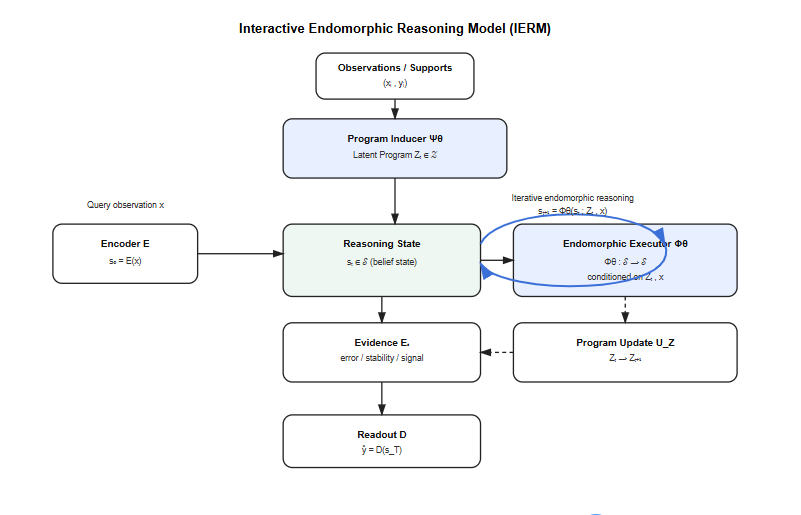

We model reasoning as the iterative application of learned endomorphic operators acting on a structured reasoning state space. The composition of these operators corresponds to recursive inference steps, enabling the emergence of algorithmic behavior rather than pattern memorization.

The system is composed of two core modules:

a Program Inducer ( Ψθ ) operating over a latent program space  Z ,
an Endomorphic Executor ( Φθ ) operating over the reasoning state space  S .
Program induction produces and revises hypotheses in the form of latent programs, while program execution applies these programs as endomorphisms over the reasoning state.

Program revision is governed by an update operator  UZ , which enables hypothesis refinement based on accumulated evidence. The final output is obtained via a readout operator  D , which maps the final reasoning state to the observation space and does not participate in the reasoning dynamics.

## Formal Framework — Interactive Endomorphic Reasoning Model (IERM)

### 1. Fundamental Spaces

#### Observation Space

Let **$\mathcal{X}$** and **$\mathcal{Y}$** be the observation spaces, where:

- **$x \in \mathcal{X}$** denotes raw observations (inputs, givens, queries, supports),
- **$y \in \mathcal{Y}$** denotes the expected final observation (solution, target).

Observations are **not** reasoning states.  
They do not evolve during reasoning and do not belong to the endomorphic dynamics.

---

#### Reasoning State Space

Let **$\mathcal{S}$** be the reasoning state space.

Elements **$s \in \mathcal{S}$** represent **belief states**: hypothetical, intermediate, revisable, and structured
(e.g. grids, fields, slots, graphs, constraint states).

The reasoning state is the **support of reasoning**, not its cause.  
It evolves through internal endomorphic transformations.

---

#### Latent Program Space

Let **$\mathcal{Z}$** be the latent program space.

Elements **$z \in \mathcal{Z}$** represent abstract programs or rules, not outputs.

Latent programs parameterize **endomorphisms of the reasoning space**:


$$\mathcal{Z} \subset End(\mathcal{S})$$


This inclusion is understood in a **differentiable and parametric sense**:  
each **$z$** indexes a differentiable operator **$\Phi_\theta(\cdot; z)$** acting on **$\mathcal{S}$**, rather than being an explicit function.

---

### 2. Core Operators

#### Observation Encoder

The Observation Encoder is denoted by **$E$**:


$$E : \mathcal{X} \rightarrow \mathcal{S}$$


It injects a raw observation into the reasoning state space by producing an initial belief state:


$$s_0 = E(x)$$


The encoder does **not** participate in reasoning dynamics and is not endomorphic.

---

#### Program Inducer

The Program Inducer is denoted by **$\Psi_\theta$**.

Its role is to induce an initial latent program hypothesis from observed supports:


$$z_0 = \Psi_\theta(\{(x_i, y_i)\}_{i=1}^k)$$


The induced program represents a hypothesis about the underlying structure or transformation
shared by the supports.

---

#### Endomorphic Executor

The Endomorphic Executor is denoted by **$\Phi_\theta$**.

It updates the reasoning state by conditionally executing the current latent program:


$$s_{t+1} = \Phi_\theta(s_t; z_t, x)$$


with the property:


$$\Phi_\theta(\cdot; z_t) : \mathcal{S} \rightarrow \mathcal{S}$$


The executor is composable, stateful, and conditioned by both the latent program and the query observation.

---

#### Evidence Signal

Let **$\varepsilon_t \in \mathcal{E}$** denote an internal evidence signal.

Evidence captures stability, error, constraint violation, or consistency information
extracted from the evolution of the reasoning state.

Evidence is **not** an observation and does not belong to **$\mathcal{X}$**.

---

#### Program Update Operator

The Program Update operator is denoted by **$U_{\mathcal{Z}}$**.

It revises the latent program independently of state execution:


$$z_{t+1} = U_{\mathcal{Z}}(z_t; s_t, \varepsilon_t)$$


This separation allows hypothesis refinement without destabilizing the reasoning state.

---

### 3. Coupled Endomorphic Dynamics

Reasoning is defined as a discrete-time dynamical system over the joint space:


$$(s_t, z_t) \in \mathcal{S} \times \mathcal{Z}$$


with coupled updates:


\begin{cases}
s_{t+1} = \Phi_\theta(s_t; z_t, x) \\
z_{t+1} = U_{\mathcal{Z}}(z_t; s_t, \varepsilon_t)
\end{cases}


The interaction between execution and program revision constitutes the core reasoning mechanism.

---

### 4. Interactive Reasoning Graph

A reasoning process induces a dynamic graph **$G = (V, E)$**, where:

- **$V_t = (s_t, z_t)$** are reasoning nodes,
- edges correspond to:
  - execution transitions induced by **$\Phi_\theta$**,
  - program revisions induced by **$U_{\mathcal{Z}}$**.

Reasoning corresponds to traversing this graph under a finite reasoning budget or until convergence.

---

### 5. Readout

The final output is obtained via a readout operator:


$$\hat{y} = D(s_T)$$


The readout does **not** participate in the reasoning dynamics and does not influence state evolution.

---

### 6. Canonical System Summary


\begin{aligned}
s_0 &= E(x) \\
z_0 &= \Psi_\theta(\{(x_i, y_i)\}_{i=1}^k) \\
s_{t+1} &= \Phi_\theta(s_t; z_t, x) \\
z_{t+1} &= U_{\mathcal{Z}}(z_t; s_t, \varepsilon_t) \\
\hat{y} &= D(s_T)
\end{aligned}


The process terminates by convergence or by a predefined reasoning budget.

---

### 7. Inductive Bias

A central inductive bias of IERMs is the explicit **decoupling between program induction and program execution**.

Latent programs reside in a distinct space:


$$\mathcal{Z} \subset End(\mathcal{S})$$


and are applied conditionally to the reasoning state via the Endomorphic Executor.

This separation prevents the entanglement of reasoning dynamics with observation-specific features
and enables programs to generalize across inputs sharing the same underlying structure.

Reasoning is not prediction, not attention-only, and not supervised algorithm imitation.  
It emerges as a structured endomorphic dynamics over internal belief states.


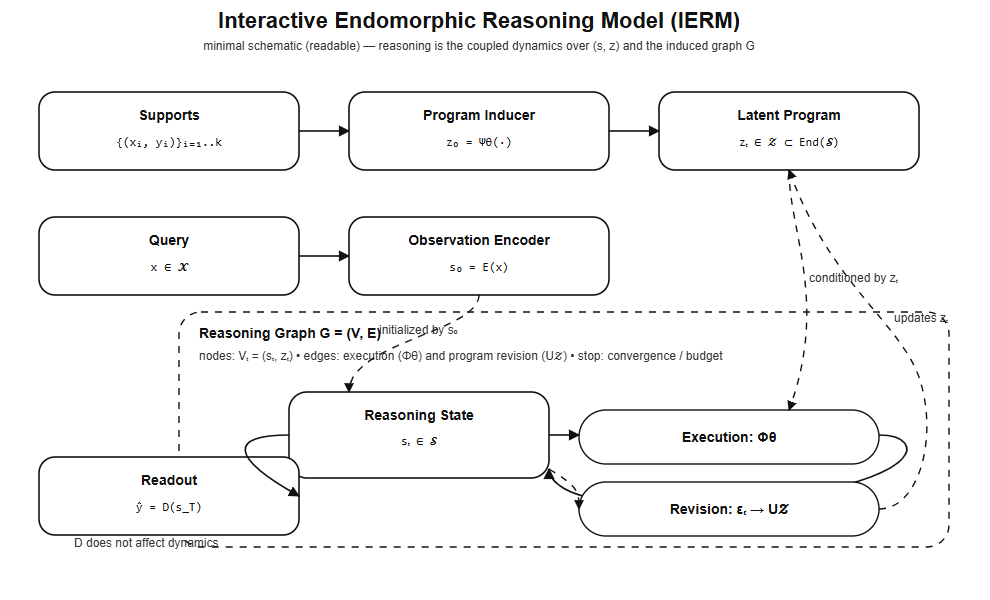

In [ ]:
“Given a few transitions, infer the underlying rule”

Not :

“Here is the rule”


# 🧾 Cell 1 — Imports & règle de Conway

In [ ]:
# Cell 1 — Imports & règle de Conway

import math
import random
import time

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


def conway_step(x: torch.Tensor) -> torch.Tensor:
    """
    Applique un pas de temps du Jeu de la Vie de Conway.

    x: (B, 1, H, W) avec valeurs {0,1}
    return: (B, 1, H, W) avec valeurs {0,1}
    """
    # Kernel 3x3 de voisins
    kernel = torch.ones((1, 1, 3, 3), device=x.device)
    # Somme sur voisins + soi-même
    neigh = F.conv2d(x.float(), kernel, padding=1)
    # Retirer la cellule elle-même pour ne garder que les voisins
    neigh = neigh - x

    alive = x == 1

    # Règles :
    # - Cellule vivante avec 2 ou 3 voisins => reste vivante
    # - Cellule morte avec exactement 3 voisins => devient vivante
    stay_alive = alive & ((neigh == 2) | (neigh == 3))
    born = (~alive) & (neigh == 3)

    y = stay_alive | born
    return y.float()


def sample_random_grids(batch_size: int, H: int, W: int,
                        p_range=(0.1, 0.4)) -> torch.Tensor:
    """
    Génère des grilles binaires aléatoires.

    p_range : intervalle de densité de cellules vivantes.
    """
    p = random.uniform(*p_range)
    return (torch.rand(batch_size, 1, H, W) < p).float()


Using device: cuda


# 🧾 Cell 2 — Old Model µConway (SupportEncoder + LocalUpdateNet)

#### µConway marche ici  comme un GoT minimal “one-shot” : Ψ(support) → z, puis Φ(z, xq) → ŷ.

In [ ]:
# Cell 2 — Modèle µConway : encodeur de support + opérateur local

class SupportEncoder(nn.Module):
    """
    Encode un ensemble de paires (x_i, y_i) en un vecteur latent z_P
    qui représente la 'règle' apprise pour la tâche.
    """
    def __init__(self, hidden: int = 64, z_dim: int = 64):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
        )
        self.fc = nn.Linear(64, z_dim)

    def forward(self, xs: torch.Tensor, ys: torch.Tensor) -> torch.Tensor:
        """
        xs, ys: (S, 1, H, W)
        Retourne: z (z_dim,)
        """
        # Concatène input + output le long des canaux
        h = torch.cat([xs, ys], dim=1)  # (S, 2, H, W)
        h = self.conv(h)                # (S, 64, H, W)
        h = h.mean(dim=[2, 3])          # Global average pooling => (S, 64)
        z = self.fc(h)                  # (S, z_dim)
        z = z.mean(dim=0)               # Agrégation par moyenne sur S => (z_dim,)
        return z


class LocalUpdateNet(nn.Module):
    """
    Opérateur local conditionné par z.
    Prend un patch 3x3 + z, prédit la probabilité que la cellule centrale soit vivante.
    """
    def __init__(self, z_dim: int = 64, hidden: int = 64):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(9 + z_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 1)
        )

    def forward(self, x: torch.Tensor, z: torch.Tensor) -> torch.Tensor:
        """
        x: (B, 1, H, W)  — grille query
        z: (z_dim,) ou (B, z_dim)
        return: logits (B, 1, H, W)
        """
        B, C, H, W = x.shape
        # Extraire tous les patches 3x3
        patches = F.unfold(x, kernel_size=3, padding=1)  # (B, 9, H*W)
        patches = patches.transpose(1, 2).reshape(-1, 9)  # (B*H*W, 9)

        # Étendre z sur toutes les positions
        if z.dim() == 1:
            z_expand = z.unsqueeze(0).expand(B * H * W, -1)
        else:
            # Cas théorique: z shape (B, z_dim)
            z_expand = z[:, None, :].expand(B, H * W, -1).reshape(B * H * W, -1)

        inp = torch.cat([patches, z_expand], dim=1)  # (B*H*W, 9 + z_dim)
        logits = self.mlp(inp).squeeze(-1)          # (B*H*W)
        logits = logits.view(B, 1, H, W)
        return logits


class MuConway(nn.Module):
    """
    µConway = µTheory appliqué au Jeu de la Vie.
    - encode un support set -> z_P
    - applique un opérateur local conditionné par z_P
    """
    def __init__(self, z_dim: int = 64):
        super().__init__()
        self.encoder = SupportEncoder(z_dim=z_dim)
        self.local = LocalUpdateNet(z_dim=z_dim)

    def forward(self,
                support_x: torch.Tensor,
                support_y: torch.Tensor,
                query_x: torch.Tensor) -> torch.Tensor:
        """
        support_x: (S, 1, Hs, Ws)
        support_y: (S, 1, Hs, Ws)
        query_x:   (B, 1, Hq, Wq)
        return: logits (B, 1, Hq, Wq)
        """
        z = self.encoder(support_x, support_y)  # (z_dim,)
        logits = self.local(query_x, z)        # (B, 1, Hq, Wq)
        return logits


model = MuConway(z_dim=64).to(device)
print("Nombre de paramètres :", sum(p.numel() for p in model.parameters()))


Nombre de paramètres : 28065


on va le remettre strictement dans le cadre GoT-EO en ajoutant la boucle fermée :

Program Inducer Ψθ : produit et révise 𝑧𝑡 (programme latent) Endomorphic Executor Φθ : applique zt pour mettre à jour un belief state 𝑠𝑡st	​ Evidence : on évalue Φ sur le support pour obtenir un signal d’erreur → sert à réviser
𝑧

Sortie :𝑦^=𝐷(𝑠𝑇) (ici D = identité ou sigmoid?)

code PyTorch : **Ψ = encoder + GRUCell de révision, Φ =  LocalUpdateNet, et un rollout 𝑍↔Φ sur T steps**.

# GoT-ER µConway (Ψ révisable, Φ endomorphique, boucle fermée)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# ----------------------------
# Utilities: handle batched tasks
# ----------------------------
def _ensure_batched_support(sx, sy):
    """
    Accept:
      sx,sy: (S,1,H,W) or (B,S,1,H,W)
    Return:
      sx,sy: (B,S,1,H,W), B inferred
    """
    if sx.dim() == 4:
        sx = sx.unsqueeze(0)
        sy = sy.unsqueeze(0)
    assert sx.dim() == 5 and sy.dim() == 5
    return sx, sy

def _ensure_batched_query(qx, qy=None):
    """
    Accept:
      qx: (1,H,W) or (B,1,H,W)
    Return:
      qx: (B,1,H,W)
    """
    if qx.dim() == 3:
        qx = qx.unsqueeze(0)
    assert qx.dim() == 4
    if qy is None:
        return qx
    if qy.dim() == 3:
        qy = qy.unsqueeze(0)
    return qx, qy


# ----------------------------
# Φθ : Endomorphic Executor ( opérateur local)
# ----------------------------
class LocalUpdateNet(nn.Module):
    """
    Φθ(s_t; z_t): met à jour un belief-state spatial (logits ou proba)
    Ici: applique une règle locale type Conway via patch 3x3 + z
    """
    def __init__(self, z_dim: int = 64, hidden: int = 64):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(9 + z_dim, hidden),
            nn.ReLU(),
            nn.Linear(hidden, 1)
        )

    def forward(self, x: torch.Tensor, z: torch.Tensor) -> torch.Tensor:
        """
        x: (B,1,H,W)
        z: (B,z_dim)  (IMPORTANT: batched ici)
        return: logits (B,1,H,W)
        """
        B, C, H, W = x.shape
        patches = F.unfold(x, kernel_size=3, padding=1)         # (B,9,H*W)
        patches = patches.transpose(1, 2).reshape(-1, 9)        # (B*H*W,9)

        z_expand = z[:, None, :].expand(B, H * W, -1).reshape(B * H * W, -1)
        inp = torch.cat([patches, z_expand], dim=1)             # (B*H*W,9+z_dim)

        logits = self.mlp(inp).squeeze(-1).view(B, 1, H, W)
        return logits


# ----------------------------
# Ψθ : Program Inducer = encoder + révision récurrente de z_t
# ----------------------------
class SupportEncoder(nn.Module):
    """
    Encoder support -> z0.
    Identique à ton idée mais version batched.
    """
    def __init__(self, z_dim: int = 64):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 32, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(),
        )
        self.fc = nn.Linear(64, z_dim)

    def forward(self, sx: torch.Tensor, sy: torch.Tensor) -> torch.Tensor:
        """
        sx,sy: (B,S,1,H,W)
        return: z0 (B,z_dim)
        """
        B, S, C, H, W = sx.shape
        h = torch.cat([sx, sy], dim=2)                  # (B,S,2,H,W)
        h = h.view(B * S, 2, H, W)
        h = self.conv(h)                               # (B*S,64,H,W)
        h = h.mean(dim=[2, 3])                         # (B*S,64)
        z = self.fc(h).view(B, S, -1).mean(dim=1)      # (B,z_dim)
        return z


class ProgramInducer(nn.Module):
    """
    Ψθ : z_{t+1} = GRUCell( feature(support, pred, err), z_t )
    On fabrique un "evidence vector" très cheap mais efficace:
      - stats d'erreur sur support: mean|p-y|, mean(p), mean(y), etc.
    """
    def __init__(self, z_dim: int = 64, feat_dim: int = 8):
        super().__init__()
        self.encoder = SupportEncoder(z_dim=z_dim)
        self.feat_proj = nn.Sequential(
            nn.Linear(feat_dim, 64),
            nn.ReLU(),
            nn.Linear(64, z_dim),
        )
        self.gru = nn.GRUCell(input_size=z_dim, hidden_size=z_dim)

    @staticmethod
    def _support_evidence(support_logits: torch.Tensor, support_y: torch.Tensor) -> torch.Tensor:
        """
        support_logits: (B,S,1,H,W)
        support_y:      (B,S,1,H,W) in {0,1}
        returns: feats (B,feat_dim)
        """
        p = torch.sigmoid(support_logits)
        y = support_y
        err = (p - y).abs()

        # Quelques stats simples (feat_dim=8)
        feats = torch.stack([
            err.mean(dim=[1,2,3,4]),               # 0 mean abs error
            (err**2).mean(dim=[1,2,3,4]),          # 1 mse-ish
            p.mean(dim=[1,2,3,4]),                 # 2 mean pred
            y.mean(dim=[1,2,3,4]),                 # 3 mean target
            (p > 0.5).float().mean(dim=[1,2,3,4]), # 4 alive ratio hard
            (y > 0.5).float().mean(dim=[1,2,3,4]), # 5 alive ratio true
            (p * y).mean(dim=[1,2,3,4]),           # 6 overlap
            (p * (1 - y)).mean(dim=[1,2,3,4]),     # 7 false positives proxy
        ], dim=1)
        return feats

    def forward(self, sx: torch.Tensor, sy: torch.Tensor, phi: nn.Module, z_t: torch.Tensor = None):
        """
        sx,sy: (B,S,1,H,W)
        z_t: (B,z_dim) or None -> init via encoder
        returns: z_next (B,z_dim), evidence_feats (B,feat_dim)
        """
        if z_t is None:
            z_t = self.encoder(sx, sy)

        # Evidence: comment z_t explique le support via Φ
        B, S, _, H, W = sx.shape
        sx_flat = sx.view(B * S, 1, H, W)
        z_flat  = z_t[:, None, :].expand(B, S, z_t.size(-1)).contiguous().view(B * S, -1)

        sup_logits_flat = phi(sx_flat, z_flat)                      # (B*S,1,H,W)
        sup_logits = sup_logits_flat.view(B, S, 1, H, W)            # (B,S,1,H,W)

        feats = self._support_evidence(sup_logits, sy)              # (B,feat_dim)
        inp = self.feat_proj(feats)                                 # (B,z_dim)

        z_next = self.gru(inp, z_t)                                  # (B,z_dim)
        return z_next, feats


# ----------------------------
# GoT-EO Conway: boucle Z <-> Φ, belief state s_t
# ----------------------------
class GoTEOConway(nn.Module):
    def __init__(self, z_dim: int = 64, hidden: int = 64):
        super().__init__()
        self.psi = ProgramInducer(z_dim=z_dim, feat_dim=8)
        self.phi = LocalUpdateNet(z_dim=z_dim, hidden=hidden)

    def rollout_steps(self, sx, sy, qx, n_steps: int = 3, detach_belief: bool = False):
        """
        sx,sy: (S,1,H,W) or (B,S,1,H,W)
        qx:    (B,1,H,W) or (1,H,W)
        Returns:
          logits_T: (B,1,H,W)
          z_T: (B,z_dim)
          trace: dict with optional diagnostics
        """
        sx, sy = _ensure_batched_support(sx, sy)
        qx = _ensure_batched_query(qx)

        B, S, _, H, W = sx.shape
        assert qx.shape[-2:] == (H, W), "Pour Conway 1-step, on garde H,W identiques."

        # belief state s_0 : on part de la query (peut être logits=qx)
        # Ici on travaille directement en "état cellule" dans [0,1] (belief)
        s = qx.float()
        z = None

        trace = {"z": [], "feats": []}

        for t in range(n_steps):
            # (1) Ψ : met à jour le programme latent
            z, feats = self.psi(sx, sy, self.phi, z_t=z)
            trace["z"].append(z)
            trace["feats"].append(feats)

            # (2) Φ : applique z_t sur belief state
            logits = self.phi(s, z)          # (B,1,H,W)
            s_next = torch.sigmoid(logits)   # belief update

            if detach_belief:
                s_next = s_next.detach()

            s = s_next

        return logits, z, trace

    def forward(self, sx, sy, qx, n_steps: int = 3):
        logits, zT, trace = self.rollout_steps(sx, sy, qx, n_steps=n_steps)
        return logits


# ---- instanciation
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GoTEOConway(z_dim=64, hidden=64).to(device)
print("Params:", sum(p.numel() for p in model.parameters()))


Params: 57761


# A — Patterns Conway (train vs eval) + stamping

In [ ]:
import torch
import torch.nn.functional as F
import random

# ----------------------------
# Patterns (matrices 0/1)
# ----------------------------
PATTERNS_TRAIN = {
    # still lifes / oscillators / small movers
    "block": [
        [1,1],
        [1,1],
    ],
    "beehive": [
        [0,1,1,0],
        [1,0,0,1],
        [0,1,1,0],
    ],
    "blinker": [
        [1,1,1],
    ],
    "toad": [
        [0,1,1,1],
        [1,1,1,0],
    ],
    "beacon": [
        [1,1,0,0],
        [1,1,0,0],
        [0,0,1,1],
        [0,0,1,1],
    ],
    "glider": [
        [0,1,0],
        [0,0,1],
        [1,1,1],
    ],
    "lwss": [  # lightweight spaceship
        [0,1,1,1,1],
        [1,0,0,0,1],
        [0,0,0,0,1],
        [1,0,0,1,0],
    ],
}

PATTERNS_EVAL = {
    # patterns "connus" mais pas vus en train
    "pulsar": [
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
    ],
    # Gosper glider gun (canon)
    "gosper_gun": [
        [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
        [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1],
        [0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0],
    ],
}

def to_tensor(pattern_2d):
    return torch.tensor(pattern_2d, dtype=torch.float32)

def stamp_pattern(grid, pat, top, left):
    """
    grid: (1,H,W) float {0,1}
    pat:  (h,w) float {0,1}
    """
    H, W = grid.shape[-2], grid.shape[-1]
    h, w = pat.shape[-2], pat.shape[-1]
    # clip
    if top < 0 or left < 0 or top + h > H or left + w > W:
        return grid
    g = grid.clone()
    g[..., top:top+h, left:left+w] = torch.maximum(g[..., top:top+h, left:left+w], pat)
    return g


# B — Générateur d’épisodes (support set + query) à partir de patterns disjoints

In [ ]:
def conway_step(x: torch.Tensor) -> torch.Tensor:
    kernel = torch.ones((1, 1, 3, 3), device=x.device)
    neigh = F.conv2d(x.float(), kernel, padding=1) - x
    alive = x == 1
    stay_alive = alive & ((neigh == 2) | (neigh == 3))
    born = (~alive) & (neigh == 3)
    return (stay_alive | born).float()

@torch.no_grad()
def simulate(x0, steps: int):
    xs = [x0]
    x = x0
    for _ in range(steps):
        x = conway_step(x)
        xs.append(x)
    return xs  # length steps+1

def make_pattern_episode(pattern_dict, H=64, W=64, k_support=4, t_max=20):
    """
    Returns:
      support_x: (S,1,H,W)
      support_y: (S,1,H,W)
      query_x:   (1,1,H,W)
      query_y:   (1,1,H,W)
    """
    name = random.choice(list(pattern_dict.keys()))
    pat = to_tensor(pattern_dict[name])
    ph, pw = pat.shape

    # random placement
    grid = torch.zeros(1, H, W)
    top = random.randint(0, H - ph)
    left = random.randint(0, W - pw)
    grid = stamp_pattern(grid, pat, top, left)

    # optionally add small noise so the same pattern isn't always identical
    # (keeps same rule; just different initial condition)
    if random.random() < 0.3:
        noise = (torch.rand(1, H, W) < 0.01).float()
        grid = torch.clamp(grid + noise, 0, 1)

    x0 = grid.unsqueeze(0)  # (1,1,H,W)
    seq = simulate(x0, steps=t_max)  # list of (1,1,H,W)

    # sample supports at random times
    support_pairs = []
    for _ in range(k_support):
        t = random.randint(0, t_max - 1)
        support_pairs.append((seq[t], seq[t+1]))

    # query at a different random time
    tq = random.randint(0, t_max - 1)
    qx, qy = seq[tq], seq[tq+1]

    support_x = torch.cat([p[0] for p in support_pairs], dim=0)  # (S,1,H,W)
    support_y = torch.cat([p[1] for p in support_pairs], dim=0)  # (S,1,H,W)
    return support_x, support_y, qx, qy, name


# C — Dataset PyTorch (train/eval disjoints) + DataLoader

In [ ]:
from torch.utils.data import Dataset, DataLoader

class ConwayMetaDataset(Dataset):
    def __init__(self, split="train", n_episodes=10000, H=64, W=64, k_support=4, t_max=20):
        self.split = split
        self.n_episodes = n_episodes
        self.H, self.W = H, W
        self.k_support = k_support
        self.t_max = t_max
        self.patterns = PATTERNS_TRAIN if split == "train" else PATTERNS_EVAL

    def __len__(self):
        return self.n_episodes

    def __getitem__(self, idx):
        sx, sy, qx, qy, name = make_pattern_episode(
            self.patterns, H=self.H, W=self.W, k_support=self.k_support, t_max=self.t_max
        )
        # Retour: support (S,1,H,W), query (1,1,H,W)
        return sx, sy, qx, qy

def collate_meta(batch):
    # batch list of tuples (sx,sy,qx,qy)
    # -> pack into (B,S,1,H,W) and (B,1,H,W)
    sxs, sys, qxs, qys = zip(*batch)
    support_x = torch.stack(sxs, dim=0)  # (B,S,1,H,W)
    support_y = torch.stack(sys, dim=0)
    query_x   = torch.cat(qxs, dim=0)    # each qx is (1,1,H,W) -> cat => (B,1,H,W)
    query_y   = torch.cat(qys, dim=0)
    return support_x, support_y, query_x, query_y

# Example loaders
H, W = 64, 64
train_ds = ConwayMetaDataset("train", n_episodes=20000, H=H, W=W, k_support=4, t_max=20)
eval_ds  = ConwayMetaDataset("eval",  n_episodes=2000,  H=H, W=W, k_support=4, t_max=40)

train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=2, collate_fn=collate_meta)
eval_loader  = DataLoader(eval_ds,  batch_size=16, shuffle=False, num_workers=2, collate_fn=collate_meta)


# Test final : random grids vs simulation exacte

In [ ]:
@torch.no_grad()
def test_random(model, n=256, H=64, W=64, p_range=(0.1,0.4), n_steps_got=3):
    model.eval()
    x = (torch.rand(n,1,H,W, device=device) < random.uniform(*p_range)).float()
    y_true = conway_step(x)

    # support “neutre” : on peut soit fabriquer un support depuis x lui-même,
    # soit tirer un support train (plus réaliste). Ici: support = quelques paires tirées de x.
    # Option simple: support = 4 copies (x -> step(x)) pour forcer z à capter la règle.
    S = 4
    sx = x[:S].detach().clone()          # (S,1,H,W)
    sy = conway_step(sx)

    logits = model(sx, sy, x, n_steps=n_steps_got)  # selon ta signature GoT-ER
    y_pred = (torch.sigmoid(logits) > 0.5).float()

    acc = (y_pred == y_true).float().mean().item()
    return acc


# Cell 1 — Dataset 32×32 (train/eval disjoints) + loader CPU

In [ ]:
import torch
import torch.nn.functional as F
import random
from torch.utils.data import Dataset, DataLoader

device = torch.device("cuda")  # CPU only
print("Using device:", device)

def conway_step(x: torch.Tensor) -> torch.Tensor:
    kernel = torch.ones((1, 1, 3, 3), device=x.device)
    neigh = F.conv2d(x.float(), kernel, padding=1) - x
    alive = x == 1
    stay_alive = alive & ((neigh == 2) | (neigh == 3))
    born = (~alive) & (neigh == 3)
    return (stay_alive | born).float()

@torch.no_grad()
def simulate(x0, steps: int):
    xs = [x0]
    x = x0
    for _ in range(steps):
        x = conway_step(x)
        xs.append(x)
    return xs

# --- Patterns (small for 32x32)
PATTERNS_TRAIN = {
    "block": [[1,1],[1,1]],
    "beehive": [[0,1,1,0],[1,0,0,1],[0,1,1,0]],
    "blinker": [[1,1,1]],
    "toad": [[0,1,1,1],[1,1,1,0]],
    "beacon": [[1,1,0,0],[1,1,0,0],[0,0,1,1],[0,0,1,1]],
    "glider": [[0,1,0],[0,0,1],[1,1,1]],
    "lwss": [[0,1,1,1,1],[1,0,0,0,1],[0,0,0,0,1],[1,0,0,1,0]],
}
PATTERNS_EVAL = {
    "pulsar": [
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [1,0,0,0,0,1,0,1,0,0,0,0,1],
        [0,0,0,0,0,0,0,0,0,0,0,0,0],
        [0,0,1,1,1,0,0,0,1,1,1,0,0],
    ],
    "rpentomino": [[0,1,1],[1,1,0],[0,1,0]],
    "diehard": [[0,0,0,0,0,0,1,0],[1,1,0,0,0,0,0,0],[0,1,0,0,0,1,1,1]],
}

def to_tensor(pat2d):
    return torch.tensor(pat2d, dtype=torch.float32)

def stamp_pattern(grid, pat, top, left):
    H, W = grid.shape[-2], grid.shape[-1]
    h, w = pat.shape[-2], pat.shape[-1]
    if top < 0 or left < 0 or top + h > H or left + w > W:
        return grid
    g = grid.clone()
    g[..., top:top+h, left:left+w] = torch.maximum(g[..., top:top+h, left:left+w], pat)
    return g

def make_episode(patterns, H=32, W=32, k_support=4, t_max=20, noise_p=0.01):
    # (ta version actuelle peut rester si tu veux; on l'appelle depuis mixed)
    name = random.choice(list(patterns.keys()))
    pat = to_tensor(patterns[name])
    ph, pw = pat.shape

    grid = torch.zeros(1, H, W)
    top = random.randint(0, H - ph)
    left = random.randint(0, W - pw)
    grid = stamp_pattern(grid, pat, top, left)

    if random.random() < 0.4:
        grid = torch.clamp(grid + (torch.rand_like(grid) < noise_p).float(), 0, 1)

    x0 = grid.unsqueeze(0)  # (1,1,H,W)
    seq = simulate(x0, steps=t_max)

    support_pairs = []
    for _ in range(k_support):
        t = random.randint(0, t_max - 1)
        support_pairs.append((seq[t], seq[t+1]))
    tq = random.randint(0, t_max - 1)
    qx, qy = seq[tq], seq[tq+1]

    sx = torch.cat([p[0] for p in support_pairs], dim=0)  # (S,1,H,W)
    sy = torch.cat([p[1] for p in support_pairs], dim=0)
    return sx, sy, qx, qy


def make_episode_mixed(patterns, H=32, W=32, k_support=4, t_max=20,
                       mix_random_prob=0.5, p_range=(0.15, 0.35), noise_p=0.01):
    """
    50% épisodes random (pour coller au test final),
    50% épisodes patterns (pour diversité structurée).
    """
    if random.random() < mix_random_prob:
        p = random.uniform(*p_range)
        x0 = (torch.rand(1, 1, H, W) < p).float()  # (1,1,H,W)
        seq = simulate(x0, steps=t_max)

        support_pairs = []
        for _ in range(k_support):
            t = random.randint(0, t_max - 1)
            support_pairs.append((seq[t], seq[t+1]))
        tq = random.randint(0, t_max - 1)
        qx, qy = seq[tq], seq[tq+1]

        sx = torch.cat([p[0] for p in support_pairs], dim=0)
        sy = torch.cat([p[1] for p in support_pairs], dim=0)
        return sx, sy, qx, qy

    # sinon épisode pattern
    return make_episode(patterns, H=H, W=W, k_support=k_support, t_max=t_max, noise_p=noise_p)
class ConwayMetaDataset(Dataset):
    def __init__(self, split="train", n_episodes=5000, H=32, W=32, k_support=4, t_max=20,
                 mix_random_prob=None):
        self.patterns = PATTERNS_TRAIN if split == "train" else PATTERNS_EVAL
        self.n = n_episodes
        self.H, self.W = H, W
        self.k_support = k_support
        self.t_max = t_max

        # par défaut:
        # - train: mélange (0.5)
        # - eval : patterns only (0.0) => disjoint visual generalization
        if mix_random_prob is None:
            self.mix_random_prob = 0.5 if split == "train" else 0.0
        else:
            self.mix_random_prob = mix_random_prob

    def __len__(self):
        return self.n

    def __getitem__(self, idx):
        sx, sy, qx, qy = make_episode_mixed(
            self.patterns,
            H=self.H, W=self.W,
            k_support=self.k_support,
            t_max=self.t_max,
            mix_random_prob=self.mix_random_prob
        )
        return sx, sy, qx, qy


H=W=32
k_support=4

train_loader = DataLoader(
    ConwayMetaDataset("train", n_episodes=20000, H=H, W=W, k_support=k_support, t_max=20),
    batch_size=16, shuffle=True, num_workers=0, collate_fn=collate_meta
)
eval_loader = DataLoader(
    ConwayMetaDataset("eval", n_episodes=2000, H=H, W=W, k_support=k_support, t_max=30),
    batch_size=16, shuffle=False, num_workers=0, collate_fn=collate_meta
)


Using device: cuda


# Cell 2 — GoT-ER modèle (Z↔Φ) CPU (version légère mais “vraie boucle”)

```python
          Supports (sx, sy)
                |
                v
      +----------------------+
      |  Support Encoder     |
      |  (Conv + Pool + FC)  |
      +----------------------+
                |
                v
         Initial Program Z₀
                |
                v
      +----------------------+
      | Program Update (Ψθ)  |
      | Evidence + GRUCell   |
      +----------------------+
                |
                v
            Latent Zₜ
                |
                v
   +----------------------------------+
   | Local Endomorphic Executor Φθ    |
   | 3×3 patch MLP, conditioned on Zₜ|
   +----------------------------------+
                |
                v
        Belief State sₜ ∈ [0,1]^{H×W}
                |
                | (iteration t = 1…T)
                └───────────────↺
```

### 🧠 Annotation IERM (à mettre sur la figure)

𝑠𝑡 : reasoning state (cell occupancy belief)

𝑍𝑡 : latent program (cellular rule parameters)

Φθ : local endomorphic update

Ψθ : program induction + revision from supports

Iteration = repeated Φ application

Architecture du Modèle GoTER-Conway
Composants principaux :

Encoder E (SupportEncoder)

Conv2D layers : 2→16→32 channels
Pooling spatial + FC : 32→z_dim
Agrège les S exemples de support


Program Inducer Ψθ (ProgramInducer)

Contient l'Encoder E
GRU pour mise à jour itérative de z
Extracteur de features d'évidence (8 dim)


Endomorphic Executor Φθ (LocalUpdateNet)

Traite patches 3×3 locaux
MLP : [9 pixels + z_dim] → hidden → 1
Applique la règle conditionnée sur z


Evidence Eᵢ (dans ProgramInducer.evidence)

8 statistiques : erreur, précision, patterns
Compare prédictions vs vérité terrain


Program Update U_Z (GRU dans ProgramInducer)

z_{t+1} = GRU(Δz, z_t)
Raffine z basé sur l'évidence



Correspondance avec le Diagramme IERM
Le modèle implémente exactement l'architecture IERM :
Flux Principal :

Observations/Supports (x_i, y_i) → Program Inducer Ψθ produit z latent
Query x → Encoder E encode l'état initial s₀
Boucle itérative (lignes bleues) :

Reasoning State sᵢ (belief state)
Endomorphic Executor Φθ : sᵢ₊₁ = Φθ(sᵢ, z, x)
Program Update U_Z : raffinement de z via GRU
Evidence Eᵢ : feedback d'erreur/stabilité


Readout D : ŷ = D(s_T) = sigmoid(logits finaux)

Particularités de l'implémentation :

Le "Reasoning State" est maintenu comme carte de croyances probabilistes
L'exécuteur est endomorphique : opère sur le même espace (grilles 2D)
La mise à jour est conditionnée par z qui encode la règle apprise
L'évidence guide l'adaptation en ligne du programme latent

Cette architecture permet l'apprentissage de règles cellulaires (comme Conway's Game of Life) en induisant un programme latent z à partir d'exemples, puis en l'exécutant itérativement sur de nouvelles entrées.

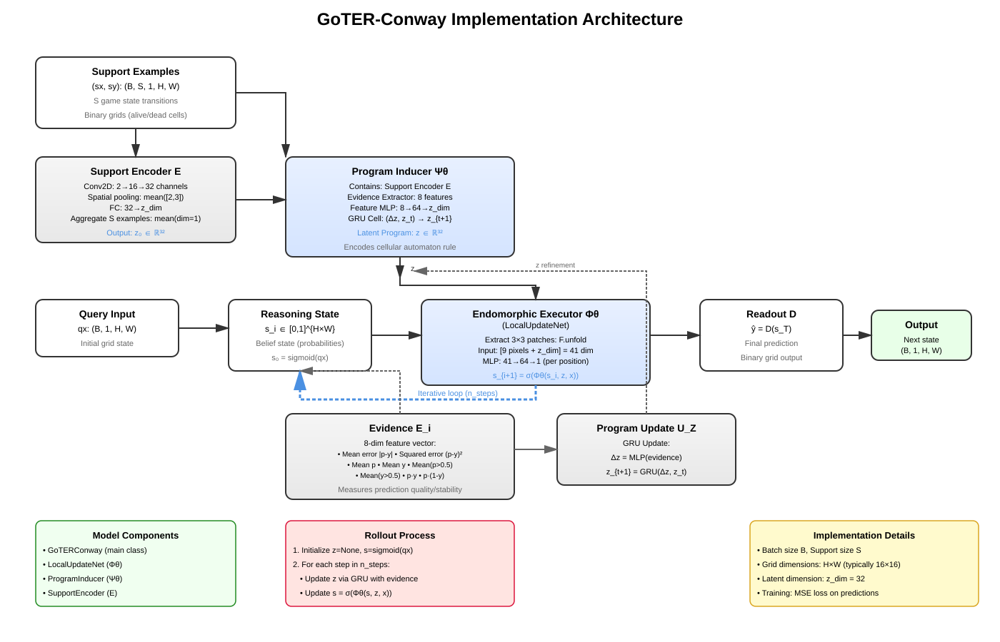

In [ ]:
from IPython.display import SVG, display

svg = r"""<?xml version="1.0" encoding="UTF-8"?>
<svg width="1400" height="900" xmlns="http://www.w3.org/2000/svg">
  <!-- Definitions for styles -->
  <defs>
    <!-- Standard arrow -->
    <marker id="arrowhead" markerWidth="10" markerHeight="10" refX="9" refY="3" orient="auto">
      <polygon points="0 0, 10 3, 0 6" fill="#333" />
    </marker>

    <!-- Iterative loop arrow -->
    <marker id="bluearrow" markerWidth="10" markerHeight="10" refX="9" refY="3" orient="auto">
      <polygon points="0 0, 10 3, 0 6" fill="#4A90E2" />
    </marker>

    <!-- Dashed arrow -->
    <marker id="dashedarrow" markerWidth="10" markerHeight="10" refX="9" refY="3" orient="auto">
      <polygon points="0 0, 10 3, 0 6" fill="#666" />
    </marker>

    <!-- Main component gradient -->
    <linearGradient id="mainGradient" x1="0%" y1="0%" x2="0%" y2="100%">
      <stop offset="0%" style="stop-color:#E8F0FF;stop-opacity:1" />
      <stop offset="100%" style="stop-color:#D4E4FF;stop-opacity:1" />
    </linearGradient>

    <!-- Secondary component gradient -->
    <linearGradient id="secondaryGradient" x1="0%" y1="0%" x2="0%" y2="100%">
      <stop offset="0%" style="stop-color:#F5F5F5;stop-opacity:1" />
      <stop offset="100%" style="stop-color:#E8E8E8;stop-opacity:1" />
    </linearGradient>
  </defs>

  <!-- Title -->
  <text x="700" y="35" font-family="Arial, sans-serif" font-size="24" font-weight="bold" text-anchor="middle">
    GoTER-Conway Implementation Architecture
  </text>

  <!-- Support Examples -->
  <rect x="50" y="80" width="280" height="100" rx="10" fill="white" stroke="#333" stroke-width="2"/>
  <text x="190" y="105" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Support Examples</text>
  <text x="190" y="125" font-family="Arial" font-size="12" text-anchor="middle">(sx, sy): (B, S, 1, H, W)</text>
  <text x="190" y="145" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">S game state transitions</text>
  <text x="190" y="165" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Binary grids (alive/dead cells)</text>

  <!-- Support Encoder E -->
  <rect x="50" y="220" width="280" height="120" rx="10" fill="url(#secondaryGradient)" stroke="#333" stroke-width="2"/>
  <text x="190" y="245" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Support Encoder E</text>
  <text x="190" y="265" font-family="Arial" font-size="11" text-anchor="middle">Conv2D: 2→16→32 channels</text>
  <text x="190" y="280" font-family="Arial" font-size="11" text-anchor="middle">Spatial pooling: mean([2,3])</text>
  <text x="190" y="295" font-family="Arial" font-size="11" text-anchor="middle">FC: 32→z_dim</text>
  <text x="190" y="310" font-family="Arial" font-size="11" text-anchor="middle">Aggregate S examples: mean(dim=1)</text>
  <text x="190" y="330" font-family="Arial" font-size="11" fill="#4A90E2" text-anchor="middle">Output: z₀ ∈ ℝ³²</text>

  <!-- Program Inducer -->
  <rect x="400" y="220" width="320" height="140" rx="10" fill="url(#mainGradient)" stroke="#333" stroke-width="2"/>
  <text x="560" y="245" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Program Inducer Ψθ</text>
  <text x="560" y="265" font-family="Arial" font-size="11" text-anchor="middle">Contains: Support Encoder E</text>
  <text x="560" y="280" font-family="Arial" font-size="11" text-anchor="middle">Evidence Extractor: 8 features</text>
  <text x="560" y="295" font-family="Arial" font-size="11" text-anchor="middle">Feature MLP: 8→64→z_dim</text>
  <text x="560" y="310" font-family="Arial" font-size="11" text-anchor="middle">GRU Cell: (Δz, z_t) → z_{t+1}</text>
  <text x="560" y="330" font-family="Arial" font-size="11" fill="#4A90E2" text-anchor="middle">Latent Program: z ∈ ℝ³²</text>
  <text x="560" y="350" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Encodes cellular automaton rule</text>

  <!-- Query Input -->
  <rect x="50" y="420" width="200" height="80" rx="10" fill="white" stroke="#333" stroke-width="2"/>
  <text x="150" y="445" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Query Input</text>
  <text x="150" y="465" font-family="Arial" font-size="12" text-anchor="middle">qx: (B, 1, H, W)</text>
  <text x="150" y="485" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Initial grid state</text>

  <!-- Reasoning State -->
  <rect x="320" y="420" width="200" height="100" rx="10" fill="white" stroke="#333" stroke-width="2"/>
  <text x="420" y="445" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Reasoning State</text>
  <text x="420" y="465" font-family="Arial" font-size="12" text-anchor="middle">s_i ∈ [0,1]^{H×W}</text>
  <text x="420" y="485" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Belief state (probabilities)</text>
  <text x="420" y="505" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">s₀ = sigmoid(qx)</text>

  <!-- Endomorphic Executor -->
  <rect x="590" y="420" width="320" height="120" rx="10" fill="url(#mainGradient)" stroke="#333" stroke-width="2"/>
  <text x="750" y="445" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Endomorphic Executor Φθ</text>
  <text x="750" y="460" font-family="Arial" font-size="12" text-anchor="middle">(LocalUpdateNet)</text>
  <text x="750" y="480" font-family="Arial" font-size="11" text-anchor="middle">Extract 3×3 patches: F.unfold</text>
  <text x="750" y="495" font-family="Arial" font-size="11" text-anchor="middle">Input: [9 pixels + z_dim] = 41 dim</text>
  <text x="750" y="510" font-family="Arial" font-size="11" text-anchor="middle">MLP: 41→64→1 (per position)</text>
  <text x="750" y="530" font-family="Arial" font-size="11" fill="#4A90E2" text-anchor="middle">s_{i+1} = σ(Φθ(s_i, z, x))</text>

  <!-- Evidence Ei -->
  <rect x="400" y="580" width="320" height="120" rx="10" fill="url(#secondaryGradient)" stroke="#333" stroke-width="2"/>
  <text x="560" y="605" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Evidence E_i</text>
  <text x="560" y="625" font-family="Arial" font-size="11" text-anchor="middle">8-dim feature vector:</text>
  <text x="560" y="640" font-family="Arial" font-size="10" text-anchor="middle">• Mean error |p-y| • Squared error (p-y)²</text>
  <text x="560" y="655" font-family="Arial" font-size="10" text-anchor="middle">• Mean p • Mean y • Mean(p>0.5)</text>
  <text x="560" y="670" font-family="Arial" font-size="10" text-anchor="middle">• Mean(y>0.5) • p·y • p·(1-y)</text>
  <text x="560" y="690" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Measures prediction quality/stability</text>

  <!-- Program Update -->
  <rect x="780" y="580" width="250" height="100" rx="10" fill="url(#secondaryGradient)" stroke="#333" stroke-width="2"/>
  <text x="905" y="605" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Program Update U_Z</text>
  <text x="905" y="625" font-family="Arial" font-size="11" text-anchor="middle">GRU Update:</text>
  <text x="905" y="645" font-family="Arial" font-size="11" text-anchor="middle">Δz = MLP(evidence)</text>
  <text x="905" y="665" font-family="Arial" font-size="11" text-anchor="middle">z_{t+1} = GRU(Δz, z_t)</text>

  <!-- Readout D -->
  <rect x="980" y="420" width="200" height="100" rx="10" fill="white" stroke="#333" stroke-width="2"/>
  <text x="1080" y="445" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Readout D</text>
  <text x="1080" y="465" font-family="Arial" font-size="12" text-anchor="middle">ŷ = D(s_T)</text>
  <text x="1080" y="485" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Final prediction</text>
  <text x="1080" y="505" font-family="Arial" font-size="11" fill="#666" text-anchor="middle">Binary grid output</text>

  <!-- Output -->
  <rect x="1220" y="435" width="140" height="70" rx="10" fill="#E8FFE8" stroke="#333" stroke-width="2"/>
  <text x="1290" y="460" font-family="Arial" font-size="14" font-weight="bold" text-anchor="middle">Output</text>
  <text x="1290" y="480" font-family="Arial" font-size="11" text-anchor="middle">Next state</text>
  <text x="1290" y="495" font-family="Arial" font-size="11" text-anchor="middle">(B, 1, H, W)</text>

  <!-- Arrows -->
  <!-- Support to Encoder -->
  <line x1="190" y1="180" x2="190" y2="220" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- Encoder to Program Inducer -->
  <line x1="330" y1="280" x2="400" y2="280" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- Program Inducer to z -->
  <line x1="560" y1="360" x2="560" y2="390" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>
  <text x="575" y="380" font-family="Arial" font-size="11" fill="#333">z</text>

  <!-- Query to Reasoning State -->
  <line x1="250" y1="460" x2="320" y2="460" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- Reasoning State to Executor -->
  <line x1="520" y1="470" x2="590" y2="470" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- z to Executor -->
  <path d="M 560 390 L 560 400 L 750 400 L 750 420" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)" fill="none"/>

  <!-- Executor to Readout -->
  <line x1="910" y1="470" x2="980" y2="470" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- Readout to Output -->
  <line x1="1180" y1="470" x2="1220" y2="470" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)"/>

  <!-- Iterative loop (blue) -->
  <path d="M 750 540 L 750 560 L 420 560 L 420 520" stroke="#4A90E2" stroke-width="3" marker-end="url(#bluearrow)" fill="none" stroke-dasharray="5,3"/>
  <text x="585" y="555" font-family="Arial" font-size="11" fill="#4A90E2">Iterative loop (n_steps)</text>

  <!-- Evidence feedback -->
  <line x1="560" y1="580" x2="560" y2="520" stroke="#666" stroke-width="2" stroke-dasharray="4,2"/>
  <line x1="560" y1="520" x2="420" y2="520" stroke="#666" stroke-width="2" stroke-dasharray="4,2" marker-end="url(#dashedarrow)"/>

  <!-- Evidence to Program Update -->
  <line x1="720" y1="630" x2="780" y2="630" stroke="#666" stroke-width="2" marker-end="url(#dashedarrow)"/>

  <!-- Program Update to z (refinement) -->
  <path d="M 905 580 L 905 380 L 580 380" stroke="#666" stroke-width="2" stroke-dasharray="4,2" marker-end="url(#dashedarrow)" fill="none"/>
  <text x="750" y="375" font-family="Arial" font-size="10" fill="#666">z refinement</text>

  <!-- Support Examples to Program Inducer -->
  <path d="M 330 130 L 400 130 L 400 220" stroke="#333" stroke-width="2" marker-end="url(#arrowhead)" fill="none"/>

  <!-- Implementation Details box -->
  <rect x="1050" y="730" width="320" height="120" rx="8" fill="#FFFACD" stroke="#DAA520" stroke-width="1.5"/>
  <text x="1210" y="755" font-family="Arial" font-size="13" font-weight="bold" text-anchor="middle">Implementation Details</text>
  <text x="1060" y="775" font-family="Arial" font-size="11">• Batch size B, Support size S</text>
  <text x="1060" y="795" font-family="Arial" font-size="11">• Grid dimensions: H×W (typically 16×16)</text>
  <text x="1060" y="815" font-family="Arial" font-size="11">• Latent dimension: z_dim = 32</text>
  <text x="1060" y="835" font-family="Arial" font-size="11">• Training: MSE loss on predictions</text>

  <!-- Model Components box -->
  <rect x="50" y="730" width="280" height="120" rx="8" fill="#F0FFF0" stroke="#228B22" stroke-width="1.5"/>
  <text x="190" y="755" font-family="Arial" font-size="13" font-weight="bold" text-anchor="middle">Model Components</text>
  <text x="60" y="775" font-family="Arial" font-size="11">• GoTERConway (main class)</text>
  <text x="60" y="795" font-family="Arial" font-size="11">• LocalUpdateNet (Φθ)</text>
  <text x="60" y="815" font-family="Arial" font-size="11">• ProgramInducer (Ψθ)</text>
  <text x="60" y="835" font-family="Arial" font-size="11">• SupportEncoder (E)</text>

  <!-- Rollout Process box -->
  <rect x="400" y="730" width="320" height="120" rx="8" fill="#FFE4E1" stroke="#DC143C" stroke-width="1.5"/>
  <text x="560" y="755" font-family="Arial" font-size="13" font-weight="bold" text-anchor="middle">Rollout Process</text>
  <text x="410" y="775" font-family="Arial" font-size="11">1. Initialize z=None, s=sigmoid(qx)</text>
  <text x="410" y="795" font-family="Arial" font-size="11">2. For each step in n_steps:</text>
  <text x="420" y="815" font-family="Arial" font-size="11">   • Update z via GRU with evidence</text>
  <text x="420" y="835" font-family="Arial" font-size="11">   • Update s = σ(Φθ(s, z, x))</text>
</svg>"""
display(SVG(data=svg))

The Conway model corresponds to a constrained instantiation of the IERM framework, where the reasoning state represents a continuous belief over cell occupancy, the latent program encodes a local cellular update rule, and reasoning emerges through repeated application of a shared endomorphic operator. Program revision is performed via evidence extracted from support transitions and does not directly modify the reasoning state

In [ ]:
import torch.nn as nn

class SupportEncoder(nn.Module):
    def __init__(self, z_dim=32):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 16, 3, padding=1), nn.ReLU(),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(),
        )
        self.fc = nn.Linear(32, z_dim)

    def forward(self, sx, sy):
        # sx,sy: (B,S,1,H,W)
        B,S,_,H,W = sx.shape
        h = torch.cat([sx, sy], dim=2).view(B*S, 2, H, W)
        h = self.conv(h).mean(dim=[2,3])          # (B*S,32)
        z = self.fc(h).view(B,S,-1).mean(dim=1)   # (B,z)
        return z

class LocalUpdateNet(nn.Module):
    def __init__(self, z_dim=32, hidden=64):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(9 + z_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, 1)
        )

    def forward(self, x, z):
        # x: (B,1,H,W), z: (B,z)
        B,_,H,W = x.shape
        patches = F.unfold(x, kernel_size=3, padding=1)          # (B,9,H*W)
        patches = patches.transpose(1,2).reshape(-1, 9)          # (B*H*W,9)
        z_expand = z[:,None,:].expand(B, H*W, z.size(-1)).reshape(B*H*W, -1)
        logits = self.mlp(torch.cat([patches, z_expand], dim=1)).view(B,1,H,W)
        return logits

class ProgramInducer(nn.Module):
    def __init__(self, z_dim=32, feat_dim=8):
        super().__init__()
        self.encoder = SupportEncoder(z_dim=z_dim)
        self.feat = nn.Sequential(nn.Linear(feat_dim, 64), nn.ReLU(), nn.Linear(64, z_dim))
        self.gru = nn.GRUCell(z_dim, z_dim)

    @staticmethod
    def evidence(sup_logits, sy):
        # sup_logits: (B,S,1,H,W)
        p = torch.sigmoid(sup_logits)
        y = sy
        err = (p-y).abs()
        feats = torch.stack([
            err.mean(dim=[1,2,3,4]),
            (err**2).mean(dim=[1,2,3,4]),
            p.mean(dim=[1,2,3,4]),
            y.mean(dim=[1,2,3,4]),
            (p>0.5).float().mean(dim=[1,2,3,4]),
            (y>0.5).float().mean(dim=[1,2,3,4]),
            (p*y).mean(dim=[1,2,3,4]),
            (p*(1-y)).mean(dim=[1,2,3,4]),
        ], dim=1)
        return feats

    def forward(self, sx, sy, phi, z=None):
        if z is None:
            z = self.encoder(sx, sy)  # (B,z)
        B,S,_,H,W = sx.shape
        sx_flat = sx.view(B*S,1,H,W)
        z_flat  = z[:,None,:].expand(B,S,z.size(-1)).contiguous().view(B*S,-1)
        sup_logits = phi(sx_flat, z_flat).view(B,S,1,H,W)
        feats = self.evidence(sup_logits, sy)
        dz = self.feat(feats)
        z_next = self.gru(dz, z)
        return z_next, sup_logits, feats

class GoTERConway(nn.Module):
    def __init__(self, z_dim=32, hidden=64):
        super().__init__()
        self.phi = LocalUpdateNet(z_dim=z_dim, hidden=hidden)
        self.psi = ProgramInducer(z_dim=z_dim)

    def rollout(self, sx, sy, qx, n_steps=3):
        # sx,sy: (B,S,1,H,W) ; qx:(B,1,H,W)
        s = qx.float()            # belief state
        z = None
        trace = {"z": [], "sup_logits": []}
        for _ in range(n_steps):
            z, sup_logits, feats = self.psi(sx, sy, self.phi, z=z)
            logits = self.phi(s, z)
            s = torch.sigmoid(logits)  # belief update
            trace["z"].append(z)
            trace["sup_logits"].append(sup_logits)
        return logits, z, trace

model = GoTERConway(z_dim=32, hidden=64).to(device)
print("Params:", sum(p.numel() for p in model.parameters()))


Params: 17745


# 1️⃣ Mapping formel :  → IERM

#### Espaces -> support (xi​,yi​)≡(sx,sy) query x≡qx
#### Reasoning state 𝑆 (s = qx.float()...logits = self.phi(s, z)s = torch.gmoid(logits)) -> st​∈[0,1]H×W belief state continu (cell alive probability)
#### Program space 𝑍 -> z ∈ R^{z_dim} initialisé par SupportEncoder révisé par GRUCell Zt​∈Rdz​⊂End(S)

#### 👉 Evidence n’update jamais s,  Evidence sert uniquement à réviser Z ✔ conforme au mot près au  cadre théorique.



| IERM |  Code                   |
| ---- | -------------------------- |
| Ψθ   | `ProgramInducer`           |
| Z₀   | `SupportEncoder(sx, sy)`   |
| U_Z  | `GRUCell(dz, z)`           |
| E_t  | `evidence(sup_logits, sy)` |

## Itération (cœur du raisonnement)

```python
for _ in range(n_steps):
    z = ψ(...)
    s = σ(φ(s, z))
```
#### Zt+1=UZ​(Zt​,st​,Et​)
#### st+1= σ(Φθ	​(st	​;Zt	​))	​


####  👉 une instanciation synchronisée de l’interaction IERM.

# NB 2️⃣ Où ce modèle est “dégénéré” (et pourquoi c’est OK)

🔹 Z n’est pas un programme symbolique

Z est un paramètre latent continu

Il paramétrise Φ, mais n’est pas une fonction explicite

➡️ C’est une instanciation “soft” de End(S)

U_Z dépend uniquement des supports

Evidence est calculée sur (sx, sy)

Pas sur le rollout de qx

➡️ Donc :

Z est global / task-level

pas encore query-adaptive

✔️ cohérent avec Conway (règle universelle).


# Cell 3 — Train + history plots (loss/acc/exact)

In [ ]:
from tqdm.auto import tqdm
import time
import torch
import torch.nn.functional as F
import torch.optim as optim

def weighted_bce_logits(logits, y, clamp_max=50.0):
    """
    BCEWithLogits pondérée dynamiquement pour compenser l’imbalance (dead >> alive).
    pos_weight = #neg/#pos (clamp pour stabilité).
    """
    with torch.no_grad():
        pos = y.sum()
        neg = y.numel() - pos
        pos_weight = (neg / (pos + 1.0)).clamp(1.0, clamp_max)
    return F.binary_cross_entropy_with_logits(logits, y.float(), pos_weight=pos_weight)

@torch.no_grad()
def metrics_from_logits(logits, y):
    p = (torch.sigmoid(logits) > 0.5).float()
    pix_acc = (p == y).float().mean().item()
    exact = ((p == y).view(y.size(0), -1).all(dim=1)).float().mean().item()
    pred_alive = p.mean().item()
    true_alive = y.mean().item()
    return pix_acc, exact, pred_alive, true_alive

@torch.no_grad()
def eval_quick(model, loader, n_steps=3, max_batches=10):
    model.eval()
    tot_loss, tot_acc, tot_exact, tot_pred_alive, tot_true_alive, n = 0.0, 0.0, 0.0, 0.0, 0.0, 0
    it = 0
    for sx, sy, qx, qy in loader:
        sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)

        logits_q, zT, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
        loss_q = weighted_bce_logits(logits_q, qy)

        # support-consistency
        B, S, _, H, W = sx.shape
        sx_flat = sx.view(B * S, 1, H, W)
        z_flat  = zT[:, None, :].expand(B, S, zT.size(-1)).contiguous().view(B * S, -1)
        sup_logits = model.phi(sx_flat, z_flat).view(B, S, 1, H, W)
        loss_s = weighted_bce_logits(sup_logits, sy)

        loss = loss_q + 0.3 * loss_s
        acc, exact, pred_alive, true_alive = metrics_from_logits(logits_q, qy)

        bs = qx.size(0)
        tot_loss += loss.item() * bs
        tot_acc  += acc * bs
        tot_exact += exact * bs
        tot_pred_alive += pred_alive * bs
        tot_true_alive += true_alive * bs
        n += bs

        it += 1
        if it >= max_batches:
            break

    return (
        tot_loss / n,
        tot_acc / n,
        tot_exact / n,
        tot_pred_alive / n,
        tot_true_alive / n
    )


def alive_ratio_loss(logits, y):
    p = torch.sigmoid(logits)
    return (p.mean() - y.float().mean()).abs()


def train_tqdm(model, train_loader, eval_loader,
               epochs=5, lr=3e-4, n_steps=3,
               log_every=20, eval_every=200, quick_eval_batches=10,
               clamp_pos_weight=12.0):
    """
    Train loop CPU-friendly:
    - tqdm progress
    - weighted BCE (query + support-consistency)
    - affiche alive ratio (pred/true) pour détecter le mode "tout mort"
    - quick eval périodique (quelques batches) pour ne pas bloquer sur CPU
    """
    opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)

    hist = {
        "train_loss": [], "train_acc": [], "train_exact": [], "train_pred_alive": [], "train_true_alive": [],
        "eval_loss":  [], "eval_acc":  [], "eval_exact":  [], "eval_pred_alive":  [], "eval_true_alive":  []
    }

    global_step = 0
    for ep in range(1, epochs + 1):
        model.train()
        running_loss, running_acc, running_exact = 0.0, 0.0, 0.0
        running_pred_alive, running_true_alive = 0.0, 0.0
        seen = 0

        pbar = tqdm(train_loader, desc=f"Epoch {ep}/{epochs}", leave=True)
        t0 = time.time()

        for batch_idx, (sx, sy, qx, qy) in enumerate(pbar, start=1):
            global_step += 1
            sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)

            opt.zero_grad()

            logits_q, zT, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
            loss_q = weighted_bce_logits(logits_q, qy, clamp_max=clamp_pos_weight)

            # support-consistency (stabilise z)
            B, S, _, H, W = sx.shape
            sx_flat = sx.view(B * S, 1, H, W)
            z_flat  = zT[:, None, :].expand(B, S, zT.size(-1)).contiguous().view(B * S, -1)
            sup_logits = model.phi(sx_flat, z_flat).view(B, S, 1, H, W)
            loss_s = weighted_bce_logits(sup_logits, sy, clamp_max=clamp_pos_weight)

            loss = loss_q + 0.3 * loss_s + 0.2 * alive_ratio_loss(logits_q, qy)

            loss.backward()
            opt.step()

            acc, exact, pred_alive, true_alive = metrics_from_logits(logits_q.detach(), qy)

            bs = qx.size(0)
            running_loss += loss.item() * bs
            running_acc  += acc * bs
            running_exact += exact * bs
            running_pred_alive += pred_alive * bs
            running_true_alive += true_alive * bs
            seen += bs

            avg_loss = running_loss / seen
            avg_acc  = running_acc / seen
            avg_ex   = running_exact / seen
            avg_pa   = running_pred_alive / seen
            avg_ta   = running_true_alive / seen

            pbar.set_postfix({
                "loss": f"{avg_loss:.4f}",
                "acc": f"{avg_acc*100:5.1f}%",
                "exact": f"{avg_ex*100:4.1f}%",
                "alive": f"{avg_pa*100:4.1f}/{avg_ta*100:4.1f}"
            })

            if (batch_idx % log_every) == 0:
                dt = time.time() - t0
                print(f"[ep {ep} | it {batch_idx}] loss={avg_loss:.4f} acc={avg_acc*100:.1f}% exact={avg_ex*100:.1f}% "
                      f"alive={avg_pa*100:.2f}/{avg_ta*100:.2f}  ({dt:.1f}s)")

            if (global_step % eval_every) == 0:
                ev = eval_quick(model, eval_loader, n_steps=n_steps, max_batches=quick_eval_batches)
                ev_loss, ev_acc, ev_ex, ev_pa, ev_ta = ev
                print(f"  -> quick-eval: loss={ev_loss:.4f} acc={ev_acc*100:.1f}% exact={ev_ex*100:.1f}% "
                      f"alive={ev_pa*100:.2f}/{ev_ta*100:.2f} (on {quick_eval_batches} batches)")
                model.train()

        # fin d'epoch: eval un peu plus stable (toujours quick)
        ev = eval_quick(model, eval_loader, n_steps=n_steps, max_batches=max(quick_eval_batches, 20))
        ev_loss, ev_acc, ev_ex, ev_pa, ev_ta = ev

        tr_loss = running_loss / seen
        tr_acc  = running_acc / seen
        tr_ex   = running_exact / seen
        tr_pa   = running_pred_alive / seen
        tr_ta   = running_true_alive / seen

        hist["train_loss"].append(tr_loss)
        hist["train_acc"].append(tr_acc)
        hist["train_exact"].append(tr_ex)
        hist["train_pred_alive"].append(tr_pa)
        hist["train_true_alive"].append(tr_ta)

        hist["eval_loss"].append(ev_loss)
        hist["eval_acc"].append(ev_acc)
        hist["eval_exact"].append(ev_ex)
        hist["eval_pred_alive"].append(ev_pa)
        hist["eval_true_alive"].append(ev_ta)

        print(f"Epoch {ep:03d} DONE | train loss {tr_loss:.4f} acc {tr_acc*100:.1f}% exact {tr_ex*100:.1f}% "
              f"alive {tr_pa*100:.2f}/{tr_ta*100:.2f} | "
              f"eval loss {ev_loss:.4f} acc {ev_acc*100:.1f}% exact {ev_ex*100:.1f}% alive {ev_pa*100:.2f}/{ev_ta*100:.2f}")

    return hist


In [ ]:
EPOCHS = 10
N_STEPS = 3
hist = train_tqdm(
    model, train_loader, eval_loader,
    epochs=5, lr=3e-4, n_steps=3,
    log_every=50, eval_every=200, quick_eval_batches=5,
    clamp_pos_weight=12.0
)


Epoch 1/5:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 1 | it 10] loss=1.5920 acc=64.5% exact=0.0% alive=32.18/8.59  (2.1s)
[ep 1 | it 20] loss=1.6419 acc=77.6% exact=0.3% alive=16.11/8.94  (2.6s)
[ep 1 | it 30] loss=1.6414 acc=82.3% exact=0.6% alive=10.74/8.73  (3.2s)
[ep 1 | it 40] loss=1.6453 acc=84.4% exact=0.6% alive=8.06/8.81  (3.7s)
[ep 1 | it 50] loss=1.6455 acc=85.9% exact=1.0% alive=6.45/8.74  (4.3s)
[ep 1 | it 60] loss=1.6437 acc=86.6% exact=0.9% alive=5.56/8.81  (4.8s)
[ep 1 | it 70] loss=1.6349 acc=85.1% exact=0.9% alive=8.40/8.75  (5.4s)
[ep 1 | it 80] loss=1.6239 acc=82.7% exact=0.9% alive=12.49/8.78  (6.0s)
[ep 1 | it 90] loss=1.6055 acc=80.5% exact=1.0% alive=16.03/8.77  (6.5s)
[ep 1 | it 100] loss=1.5817 acc=78.6% exact=1.1% alive=19.05/8.72  (7.0s)
[ep 1 | it 110] loss=1.5610 acc=77.0% exact=1.2% alive=21.64/8.79  (7.6s)
[ep 1 | it 120] loss=1.5413 acc=75.6% exact=1.2% alive=23.79/8.87  (8.1s)
[ep 1 | it 130] loss=1.5216 acc=74.9% exact=1.3% alive=25.03/8.88  (8.7s)
[ep 1 | it 140] loss=1.5038 acc=74.0% exact=1.2% al

Epoch 2/5:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 2 | it 10] loss=0.5497 acc=90.0% exact=11.2% alive=17.87/8.02  (0.6s)
[ep 2 | it 20] loss=0.5921 acc=89.1% exact=9.7% alive=19.65/8.99  (1.1s)
[ep 2 | it 30] loss=0.6001 acc=88.7% exact=9.4% alive=20.10/9.09  (1.7s)
[ep 2 | it 40] loss=0.5860 acc=89.2% exact=8.6% alive=19.38/8.80  (2.2s)
[ep 2 | it 50] loss=0.5893 acc=89.1% exact=8.6% alive=19.48/8.88  (2.8s)
[ep 2 | it 60] loss=0.5955 acc=88.8% exact=8.4% alive=20.00/9.05  (3.3s)
[ep 2 | it 70] loss=0.5972 acc=88.8% exact=9.3% alive=20.05/9.11  (3.9s)
[ep 2 | it 80] loss=0.5900 acc=89.0% exact=9.5% alive=19.75/9.00  (4.4s)
[ep 2 | it 90] loss=0.5884 acc=89.0% exact=9.6% alive=19.70/8.94  (5.0s)
[ep 2 | it 100] loss=0.5857 acc=89.1% exact=9.5% alive=19.60/8.90  (5.5s)
[ep 2 | it 110] loss=0.5856 acc=89.0% exact=9.3% alive=19.66/8.92  (6.1s)
[ep 2 | it 120] loss=0.5824 acc=89.1% exact=9.5% alive=19.54/8.89  (6.6s)
[ep 2 | it 130] loss=0.5823 acc=89.1% exact=9.5% alive=19.60/8.92  (7.3s)
[ep 2 | it 140] loss=0.5825 acc=89.1% exact=9.

Epoch 3/5:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 3 | it 10] loss=0.3415 acc=92.8% exact=5.0% alive=15.40/8.31  (0.6s)
[ep 3 | it 20] loss=0.3428 acc=92.7% exact=8.8% alive=15.45/8.28  (1.1s)
[ep 3 | it 30] loss=0.3466 acc=92.6% exact=9.4% alive=15.70/8.38  (1.6s)
[ep 3 | it 40] loss=0.3413 acc=92.7% exact=9.7% alive=15.49/8.30  (2.2s)
[ep 3 | it 50] loss=0.3362 acc=92.8% exact=9.8% alive=15.34/8.21  (2.8s)
[ep 3 | it 60] loss=0.3470 acc=92.4% exact=10.2% alive=15.97/8.52  (3.3s)
[ep 3 | it 70] loss=0.3477 acc=92.4% exact=10.0% alive=16.00/8.53  (3.9s)
[ep 3 | it 80] loss=0.3476 acc=92.4% exact=10.1% alive=15.98/8.53  (4.4s)
[ep 3 | it 90] loss=0.3489 acc=92.4% exact=9.9% alive=16.02/8.56  (5.1s)
[ep 3 | it 100] loss=0.3509 acc=92.4% exact=10.3% alive=16.12/8.64  (5.8s)
  -> quick-eval: loss=0.2057 acc=97.3% exact=3.8% alive=5.34/2.61 (on 5 batches)
[ep 3 | it 110] loss=0.3537 acc=92.3% exact=10.3% alive=16.31/8.76  (7.0s)
[ep 3 | it 120] loss=0.3551 acc=92.3% exact=10.1% alive=16.40/8.80  (7.5s)
[ep 3 | it 130] loss=0.3543 acc=92

Epoch 4/5:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 4 | it 10] loss=0.2958 acc=93.3% exact=13.8% alive=15.92/9.30  (0.6s)
[ep 4 | it 20] loss=0.2891 acc=93.5% exact=15.0% alive=15.38/8.98  (1.1s)
[ep 4 | it 30] loss=0.2945 acc=93.2% exact=15.4% alive=15.70/9.03  (1.7s)
[ep 4 | it 40] loss=0.2903 acc=93.4% exact=15.9% alive=15.38/8.90  (2.2s)
[ep 4 | it 50] loss=0.2887 acc=93.5% exact=16.5% alive=15.34/8.90  (2.8s)
  -> quick-eval: loss=0.1528 acc=97.8% exact=12.5% alive=5.32/3.10 (on 5 batches)
[ep 4 | it 60] loss=0.2920 acc=93.4% exact=16.4% alive=15.56/9.03  (3.9s)
[ep 4 | it 70] loss=0.2911 acc=93.4% exact=16.2% alive=15.48/8.96  (4.7s)
[ep 4 | it 80] loss=0.2936 acc=93.3% exact=16.2% alive=15.65/9.06  (5.3s)
[ep 4 | it 90] loss=0.2956 acc=93.2% exact=15.7% alive=15.83/9.17  (5.8s)
[ep 4 | it 100] loss=0.2928 acc=93.3% exact=15.8% alive=15.65/9.08  (6.4s)
[ep 4 | it 110] loss=0.2905 acc=93.4% exact=16.2% alive=15.53/9.01  (7.0s)
[ep 4 | it 120] loss=0.2902 acc=93.4% exact=16.1% alive=15.52/9.00  (7.5s)
[ep 4 | it 130] loss=0.2919

Epoch 5/5:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 5 | it 10] loss=0.2860 acc=93.9% exact=15.0% alive=15.97/9.93  (0.6s)
[ep 5 | it 20] loss=0.2916 acc=93.8% exact=17.5% alive=16.16/10.04  (1.3s)
[ep 5 | it 30] loss=0.2906 acc=93.7% exact=18.1% alive=16.12/9.96  (2.0s)
[ep 5 | it 40] loss=0.2773 acc=94.2% exact=18.6% alive=15.19/9.44  (2.8s)
[ep 5 | it 50] loss=0.2782 acc=94.1% exact=18.2% alive=15.28/9.51  (3.4s)
[ep 5 | it 60] loss=0.2740 acc=94.3% exact=18.0% alive=15.01/9.36  (3.9s)
[ep 5 | it 70] loss=0.2700 acc=94.3% exact=18.4% alive=14.77/9.19  (4.5s)
[ep 5 | it 80] loss=0.2696 acc=94.3% exact=18.4% alive=14.81/9.23  (5.0s)
[ep 5 | it 90] loss=0.2685 acc=94.4% exact=18.6% alive=14.75/9.19  (5.5s)
[ep 5 | it 100] loss=0.2664 acc=94.4% exact=19.0% alive=14.62/9.13  (6.1s)
[ep 5 | it 110] loss=0.2640 acc=94.5% exact=19.0% alive=14.50/9.07  (6.6s)
[ep 5 | it 120] loss=0.2637 acc=94.5% exact=18.8% alive=14.52/9.09  (7.2s)
[ep 5 | it 130] loss=0.2648 acc=94.4% exact=18.7% alive=14.61/9.15  (7.8s)
[ep 5 | it 140] loss=0.2634 acc=9

# Cell 4 — Visualisation GT / Pred / Error (propre)

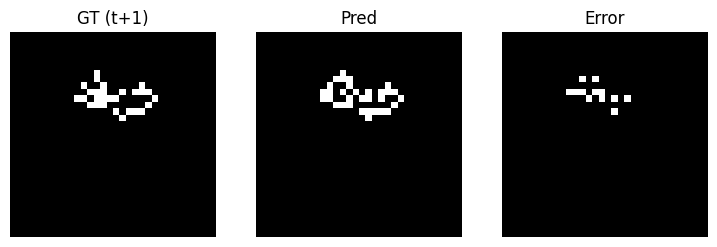

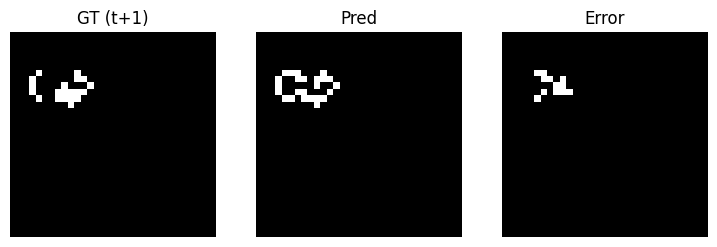

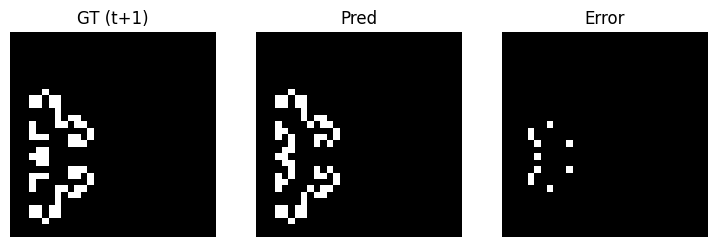

In [ ]:
import matplotlib.pyplot as plt

@torch.no_grad()
def viz_one_batch(model, loader, n_steps=3, max_items=3):
    model.eval()
    sx, sy, qx, qy = next(iter(loader))
    sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)
    logits, zT, trace = model.rollout(sx, sy, qx, n_steps=n_steps)
    pred = (torch.sigmoid(logits) > 0.5).float()
    err = (pred != qy).float()

    B = min(qx.size(0), max_items)
    for i in range(B):
        plt.figure(figsize=(9,3))
        plt.subplot(1,3,1); plt.imshow(qy[i,0].cpu(), cmap="gray"); plt.title("GT (t+1)"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(pred[i,0].cpu(), cmap="gray"); plt.title("Pred"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(err[i,0].cpu(), cmap="gray"); plt.title("Error"); plt.axis("off")
        plt.show()

viz_one_batch(model, eval_loader, n_steps=N_STEPS, max_items=3)


# Cell 5 — Test autoregressif (multi-step) vs simulation exacte

Autoreg avg pixel-acc: 0.6332421875
Autoreg exact-match rate: 0.0


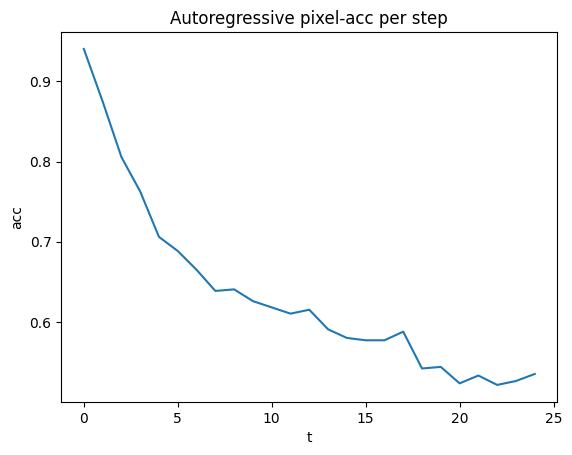

In [ ]:
@torch.no_grad()
def autoreg_eval(model, x0, sx, sy, T=20, n_steps_got=3):
    """
    x0: (1,1,H,W) état initial
    sx,sy: support (S,1,H,W) (non batché)
    Retourne:
      acc_per_t: list[float] pixel-acc à chaque pas
      exact_per_t: list[float] exact-match à chaque pas
      xs_pred, xs_true: listes de grilles (1,1,H,W)
    """
    model.eval()
    # true rollout
    xs_true = simulate(x0.to(device), steps=T)

    # pred rollout (teacher-free)
    s = x0.to(device)  # current state
    xs_pred = [s]
    accs, exacts = [], []

    # mettre en batch pour modèle
    sx_b = sx.unsqueeze(0).to(device)   # (1,S,1,H,W)
    sy_b = sy.unsqueeze(0).to(device)

    for t in range(T):
        qx_b = s  # (1,1,H,W)
        logits, zT, trace = model.rollout(sx_b, sy_b, qx_b, n_steps=n_steps_got)
        s_next = (torch.sigmoid(logits) > 0.5).float()
        xs_pred.append(s_next)

        y_true = xs_true[t+1]
        pix_acc = (s_next == y_true).float().mean().item()
        exact = ((s_next == y_true).view(1,-1).all(dim=1)).float().item()
        accs.append(pix_acc); exacts.append(exact)

        s = s_next

    return accs, exacts, xs_pred, xs_true

def sample_random_grid(batch=1, H=32, W=32, p_range=(0.1,0.4)):
    p = random.uniform(*p_range)
    return (torch.rand(batch,1,H,W) < p).float()

@torch.no_grad()
def run_autoreg_random(model, T=20, H=32, W=32, k_support=4, n_steps_got=3):
    # support = 4 paires issues de x0 (ça force la "règle")
    x0 = sample_random_grid(1, H, W)
    seq = simulate(x0, steps=10)
    sx = torch.cat([seq[i] for i in range(k_support)], dim=0)         # (S,1,H,W)
    sy = torch.cat([seq[i+1] for i in range(k_support)], dim=0)
    accs, exacts, xs_pred, xs_true = autoreg_eval(model, x0, sx, sy, T=T, n_steps_got=n_steps_got)

    print("Autoreg avg pixel-acc:", sum(accs)/len(accs))
    print("Autoreg exact-match rate:", sum(exacts)/len(exacts))

    plt.figure()
    plt.plot(accs); plt.title("Autoregressive pixel-acc per step"); plt.xlabel("t"); plt.ylabel("acc"); plt.show()

run_autoreg_random(model, T=25, H=32, W=32, k_support=4, n_steps_got=N_STEPS)


In [ ]:
import torch
import torch.nn.functional as F
import random
import matplotlib.pyplot as plt

@torch.no_grad()
def conway_rollout_true(x0, T):
    xs = [x0]
    x = x0
    for _ in range(T):
        x = conway_step(x)
        xs.append(x)
    return xs  # len T+1

@torch.no_grad()
def make_support_from_x0(x0, k_support=4, t_max=10):
    """
    Support dérivé d'un rollout court depuis x0 : (x_t -> x_{t+1}) pour t=0..k-1
    x0: (1,1,H,W)
    """
    seq = conway_rollout_true(x0, T=t_max)
    sx = torch.cat([seq[t] for t in range(k_support)], dim=0)      # (S,1,H,W)
    sy = torch.cat([seq[t+1] for t in range(k_support)], dim=0)    # (S,1,H,W)
    return sx, sy

@torch.no_grad()
def alive_stats(pred, y):
    # pred,y: (B,1,H,W) {0,1}
    tp = (pred*y).sum().item()
    fp = (pred*(1-y)).sum().item()
    fn = ((1-pred)*y).sum().item()
    eps = 1e-9
    precision = tp/(tp+fp+eps)
    recall    = tp/(tp+fn+eps)
    f1        = 2*precision*recall/(precision+recall+eps)
    iou       = tp/(tp+fp+fn+eps)
    return precision, recall, f1, iou

@torch.no_grad()
def autoreg_benchmark(model, T=25, n_cases=32, H=32, W=32,
                      p_range=(0.12, 0.35), k_support=4, n_steps_got=3,
                      show_curves=True):
    """
    Test loi pure: random x0, compare rollout modèle vs rollout conway exact.
    Returns dict with curves + averages.
    """
    model.eval()

    acc_curve = []
    exact_curve = []
    f1_curve = []
    iou_curve = []
    pred_alive_curve = []
    true_alive_curve = []

    for t in range(T):
        acc_curve.append([])
        exact_curve.append([])
        f1_curve.append([])
        iou_curve.append([])
        pred_alive_curve.append([])
        true_alive_curve.append([])

    for _ in range(n_cases):
        p = random.uniform(*p_range)
        x0 = (torch.rand(1,1,H,W) < p).float().to(device)

        # support: extrait de x0 (règle locale)
        sx, sy = make_support_from_x0(x0, k_support=k_support, t_max=max(10, k_support+1))
        sx = sx.to(device)
        sy = sy.to(device)

        # true rollout
        xs_true = conway_rollout_true(x0, T=T)

        # pred rollout
        x = x0
        for t in range(T):
            logits, zT, trace = model.rollout(
                sx.unsqueeze(0), sy.unsqueeze(0), x, n_steps=n_steps_got
            )
            x_next = (torch.sigmoid(logits) > 0.5).float()

            y_true = xs_true[t+1]
            pred = x_next
            y_true_bin = y_true

            pix_acc = (pred == y_true_bin).float().mean().item()
            exact = ((pred == y_true_bin).view(1,-1).all(dim=1)).float().item()
            prec, rec, f1, iou = alive_stats(pred, y_true_bin)

            acc_curve[t].append(pix_acc)
            exact_curve[t].append(exact)
            f1_curve[t].append(f1)
            iou_curve[t].append(iou)
            pred_alive_curve[t].append(pred.mean().item())
            true_alive_curve[t].append(y_true_bin.mean().item())

            x = x_next

    # aggregate
    def mean_curve(curve):
        return [sum(v)/len(v) for v in curve]

    acc_m = mean_curve(acc_curve)
    exact_m = mean_curve(exact_curve)
    f1_m = mean_curve(f1_curve)
    iou_m = mean_curve(iou_curve)
    pa_m = mean_curve(pred_alive_curve)
    ta_m = mean_curve(true_alive_curve)

    out = {
        "acc_curve": acc_m,
        "exact_curve": exact_m,
        "f1_curve": f1_m,
        "iou_curve": iou_m,
        "pred_alive_curve": pa_m,
        "true_alive_curve": ta_m,
        "acc_avg": sum(acc_m)/len(acc_m),
        "f1_avg": sum(f1_m)/len(f1_m),
        "iou_avg": sum(iou_m)/len(iou_m),
        "exact_avg": sum(exact_m)/len(exact_m),
    }

    print(f"[AUTOREG T={T}] avg acc={out['acc_avg']*100:.2f}% | avg F1(alive)={out['f1_avg']*100:.2f}% "
          f"| avg IoU(alive)={out['iou_avg']*100:.2f}% | avg exact={out['exact_avg']*100:.2f}%")
    print(f"Alive ratio (pred/true) @t=1: {pa_m[0]*100:.2f}% / {ta_m[0]*100:.2f}% | @t={T}: {pa_m[-1]*100:.2f}% / {ta_m[-1]*100:.2f}%")

    if show_curves:
        plt.figure(); plt.plot(acc_m); plt.title("Autoreg pixel-acc vs t"); plt.xlabel("t"); plt.ylabel("acc"); plt.show()
        plt.figure(); plt.plot(f1_m);  plt.title("Autoreg F1(alive) vs t"); plt.xlabel("t"); plt.ylabel("F1"); plt.show()
        plt.figure(); plt.plot(iou_m); plt.title("Autoreg IoU(alive) vs t"); plt.xlabel("t"); plt.ylabel("IoU"); plt.show()
        plt.figure(); plt.plot(pa_m, label="pred_alive"); plt.plot(ta_m, label="true_alive")
        plt.title("Alive ratio vs t"); plt.xlabel("t"); plt.ylabel("ratio"); plt.legend(); plt.show()

    return out

# Exemple d’appel:
# bench = autoreg_benchmark(model, T=25, n_cases=32, H=32, W=32, k_support=4, n_steps_got=3)


[AUTOREG T=25] avg acc=62.35% | avg F1(alive)=29.06% | avg IoU(alive)=18.02% | avg exact=0.00%
Alive ratio (pred/true) @t=1: 22.19% / 23.96% | @t=25: 45.15% / 12.89%


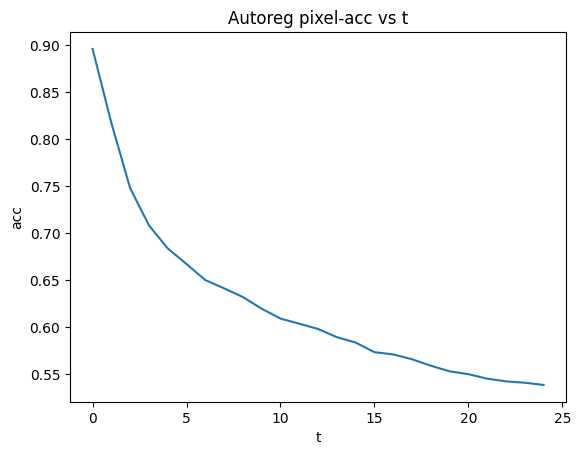

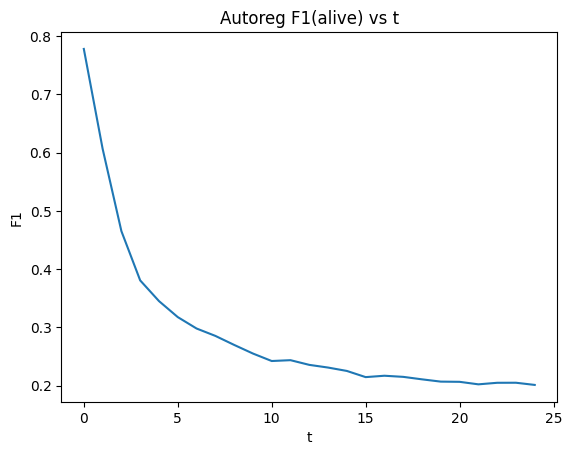

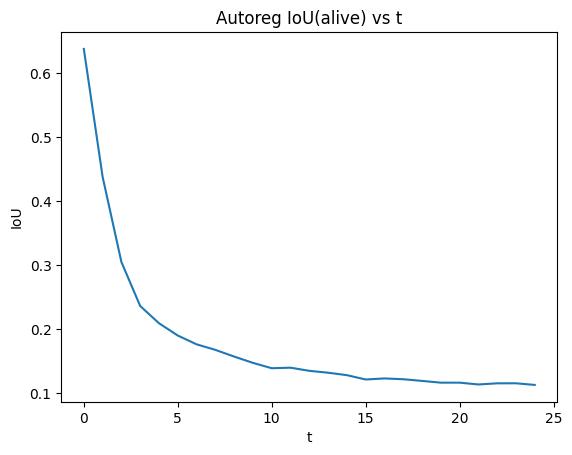

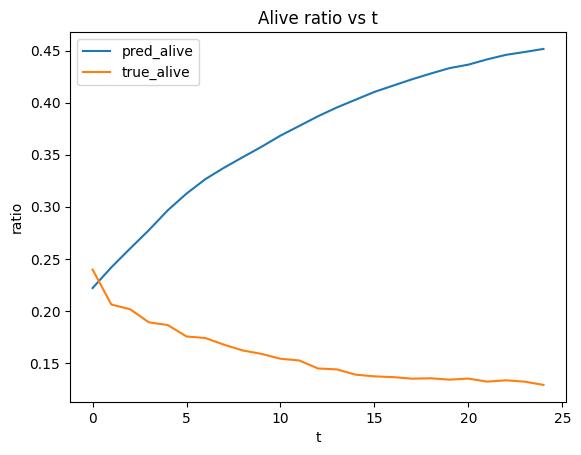

In [ ]:
bench = autoreg_benchmark(model, T=25, n_cases=32, H=32, W=32, k_support=4, n_steps_got=3)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

save_path = "/content/drive/MyDrive/goter_conway_32x32_best.pt"
torch.save({
    "model_state": model.state_dict(),
    "config": {"H": 32, "W": 32, "k_support": 4, "z_dim": 32, "hidden": 64, "n_steps": N_STEPS},
}, save_path)
print("Saved to:", save_path)


Mounted at /content/drive
Saved to: /content/drive/MyDrive/goter_conway_32x32_best.pt


In [ ]:
save_path = "/content/drive/MyDrive/goter_conway_32x32_best.pt"
ckpt = torch.load(save_path, map_location=device)
model.load_state_dict(ckpt["model_state"])
model.to(device)
model.eval()
print("Loaded:", ckpt["config"])


Loaded: {'H': 32, 'W': 32, 'k_support': 4, 'z_dim': 32, 'hidden': 64, 'n_steps': 3}


# # === NEW CELL: train_tqdm with 2-step teacher-forcing unroll (stability for autoreg rollouts) ===


In [ ]:
# === NEW CELL: train_tqdm with 2-step teacher-forcing unroll (stability for autoreg rollouts) ===

from tqdm.auto import tqdm
import time
import torch
import torch.nn.functional as F
import torch.optim as optim

def weighted_bce_logits(logits, y, clamp_max=12.0):
    with torch.no_grad():
        pos = y.sum()
        neg = y.numel() - pos
        pos_weight = (neg / (pos + 1.0)).clamp(1.0, clamp_max)
    return F.binary_cross_entropy_with_logits(logits, y.float(), pos_weight=pos_weight)

def alive_ratio_loss(logits, y):
    p = torch.sigmoid(logits)
    return (p.mean() - y.float().mean()).abs()

@torch.no_grad()
def metrics_from_logits(logits, y):
    p = (torch.sigmoid(logits) > 0.5).float()
    pix_acc = (p == y).float().mean().item()
    exact = ((p == y).view(y.size(0), -1).all(dim=1)).float().mean().item()
    pred_alive = p.mean().item()
    true_alive = y.mean().item()
    return pix_acc, exact, pred_alive, true_alive

@torch.no_grad()
def eval_quick(model, loader, n_steps=3, max_batches=10, clamp_pos_weight=12.0, tf2_weight=0.5):
    """
    Quick eval: computes the same training objective (query 1-step + 2-step TF + support consistency + alive calibration)
    on a few batches. CPU-friendly diagnostic.
    """
    model.eval()
    tot_loss, tot_acc, tot_exact, tot_pa, tot_ta, n = 0.0, 0.0, 0.0, 0.0, 0.0, 0
    it = 0

    for sx, sy, qx, qy in loader:
        sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)

        # Step 1: qx -> qy
        logits_q, zT, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
        loss_1 = weighted_bce_logits(logits_q, qy, clamp_max=clamp_pos_weight)

        # Step 2 (teacher forcing): qy -> qy2 (exact rule)
        qy2 = conway_step(qy)
        logits_q2, _, _ = model.rollout(sx, sy, qy, n_steps=n_steps)
        loss_2 = weighted_bce_logits(logits_q2, qy2, clamp_max=clamp_pos_weight)

        loss_q = loss_1 + tf2_weight * loss_2

        # support-consistency (stabilise z)
        B, S, _, H, W = sx.shape
        sx_flat = sx.view(B * S, 1, H, W)
        z_flat  = zT[:, None, :].expand(B, S, zT.size(-1)).contiguous().view(B * S, -1)
        sup_logits = model.phi(sx_flat, z_flat).view(B, S, 1, H, W)
        loss_s = weighted_bce_logits(sup_logits, sy, clamp_max=clamp_pos_weight)

        # alive calibration (on step1 logits)
        loss_cal = alive_ratio_loss(logits_q, qy)

        loss = loss_q + 0.3 * loss_s + 0.2 * loss_cal

        acc, exact, pa, ta = metrics_from_logits(logits_q, qy)

        bs = qx.size(0)
        tot_loss += loss.item() * bs
        tot_acc  += acc * bs
        tot_exact += exact * bs
        tot_pa += pa * bs
        tot_ta += ta * bs
        n += bs

        it += 1
        if it >= max_batches:
            break

    return tot_loss/n, tot_acc/n, tot_exact/n, tot_pa/n, tot_ta/n


def train_tqdm_tf2(model, train_loader, eval_loader,
                   epochs=20, lr=3e-4, n_steps=3,
                   log_every=20, eval_every=200, quick_eval_batches=5,
                   clamp_pos_weight=12.0,
                   tf2_weight=0.5):
    """
    Train loop with:
    - weighted BCE to fix class imbalance
    - 2-step teacher forcing unroll (stabilize autoregressive dynamics)
    - support-consistency term (regularize z/program)
    - alive ratio calibration term
    - tqdm + periodic quick eval
    """
    opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)

    hist = {
        "train_loss": [], "train_acc": [], "train_exact": [], "train_pred_alive": [], "train_true_alive": [],
        "eval_loss":  [], "eval_acc":  [], "eval_exact":  [], "eval_pred_alive":  [], "eval_true_alive":  [],
    }

    global_step = 0
    for ep in range(1, epochs + 1):
        model.train()
        running_loss, running_acc, running_exact = 0.0, 0.0, 0.0
        running_pa, running_ta = 0.0, 0.0
        seen = 0

        pbar = tqdm(train_loader, desc=f"Epoch {ep}/{epochs}", leave=True)
        t0 = time.time()

        for batch_idx, (sx, sy, qx, qy) in enumerate(pbar, start=1):
            global_step += 1
            sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)

            opt.zero_grad()

            # Step 1: qx -> qy
            logits_q, zT, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
            loss_1 = weighted_bce_logits(logits_q, qy, clamp_max=clamp_pos_weight)

            # Step 2 (teacher forcing): qy -> qy2 exact
            qy2 = conway_step(qy)
            logits_q2, _, _ = model.rollout(sx, sy, qy, n_steps=n_steps)
            loss_2 = weighted_bce_logits(logits_q2, qy2, clamp_max=clamp_pos_weight)

            loss_q = loss_1 + tf2_weight * loss_2

            # support-consistency (stabilise z) — use z from step1
            B, S, _, H, W = sx.shape
            sx_flat = sx.view(B * S, 1, H, W)
            z_flat  = zT[:, None, :].expand(B, S, zT.size(-1)).contiguous().view(B * S, -1)
            sup_logits = model.phi(sx_flat, z_flat).view(B, S, 1, H, W)
            loss_s = weighted_bce_logits(sup_logits, sy, clamp_max=clamp_pos_weight)

            # alive calibration (on step1)
            loss_cal = alive_ratio_loss(logits_q, qy)

            loss = loss_q + 0.3 * loss_s + 0.2 * loss_cal
            loss.backward()
            opt.step()

            acc, exact, pa, ta = metrics_from_logits(logits_q.detach(), qy)

            bs = qx.size(0)
            running_loss += loss.item() * bs
            running_acc  += acc * bs
            running_exact += exact * bs
            running_pa += pa * bs
            running_ta += ta * bs
            seen += bs

            avg_loss = running_loss / seen
            avg_acc  = running_acc / seen
            avg_ex   = running_exact / seen
            avg_pa   = running_pa / seen
            avg_ta   = running_ta / seen

            pbar.set_postfix({
                "loss": f"{avg_loss:.4f}",
                "acc": f"{avg_acc*100:5.1f}%",
                "exact": f"{avg_ex*100:4.1f}%",
                "alive": f"{avg_pa*100:4.1f}/{avg_ta*100:4.1f}"
            })

            if (batch_idx % log_every) == 0:
                dt = time.time() - t0
                print(f"[ep {ep} | it {batch_idx}] loss={avg_loss:.4f} acc={avg_acc*100:.1f}% exact={avg_ex*100:.1f}% "
                      f"alive={avg_pa*100:.2f}/{avg_ta*100:.2f}  ({dt:.1f}s)")

            if (global_step % eval_every) == 0:
                ev_loss, ev_acc, ev_ex, ev_pa, ev_ta = eval_quick(
                    model, eval_loader, n_steps=n_steps, max_batches=quick_eval_batches,
                    clamp_pos_weight=clamp_pos_weight, tf2_weight=tf2_weight
                )
                print(f"  -> quick-eval: loss={ev_loss:.4f} acc={ev_acc*100:.1f}% exact={ev_ex*100:.1f}% "
                      f"alive={ev_pa*100:.2f}/{ev_ta*100:.2f} (on {quick_eval_batches} batches)")
                model.train()

        # end epoch quick eval
        ev_loss, ev_acc, ev_ex, ev_pa, ev_ta = eval_quick(
            model, eval_loader, n_steps=n_steps, max_batches=max(quick_eval_batches, 20),
            clamp_pos_weight=clamp_pos_weight, tf2_weight=tf2_weight
        )

        tr_loss = running_loss / seen
        tr_acc  = running_acc / seen
        tr_ex   = running_exact / seen
        tr_pa   = running_pa / seen
        tr_ta   = running_ta / seen

        hist["train_loss"].append(tr_loss)
        hist["train_acc"].append(tr_acc)
        hist["train_exact"].append(tr_ex)
        hist["train_pred_alive"].append(tr_pa)
        hist["train_true_alive"].append(tr_ta)

        hist["eval_loss"].append(ev_loss)
        hist["eval_acc"].append(ev_acc)
        hist["eval_exact"].append(ev_ex)
        hist["eval_pred_alive"].append(ev_pa)
        hist["eval_true_alive"].append(ev_ta)

        print(f"Epoch {ep:03d} DONE | train loss {tr_loss:.4f} acc {tr_acc*100:.1f}% exact {tr_ex*100:.1f}% "
              f"alive {tr_pa*100:.2f}/{tr_ta*100:.2f} | "
              f"eval loss {ev_loss:.4f} acc {ev_acc*100:.1f}% exact {ev_ex*100:.1f}% alive {ev_pa*100:.2f}/{ev_ta*100:.2f}")

    return hist



# === RUN 20 epochs ===

In [ ]:
EPOCHS = 20
# N_STEPS must be defined above (e.g., N_STEPS=3)
hist_tf2 = train_tqdm_tf2(
    model, train_loader, eval_loader,
    epochs=EPOCHS, lr=3e-4, n_steps=N_STEPS,
    log_every=100, eval_every=200, quick_eval_batches=5,
    clamp_pos_weight=12.0,  # try 10.0 if pred_alive still grows in autoreg
    tf2_weight=0.5
)


Epoch 1/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 1 | it 100] loss=0.3179 acc=95.0% exact=17.6% alive=14.05/9.16  (6.0s)
[ep 1 | it 200] loss=0.3092 acc=95.1% exact=18.1% alive=13.74/8.99  (12.8s)
  -> quick-eval: loss=0.0880 acc=98.6% exact=15.0% alive=3.96/2.54 (on 5 batches)
[ep 1 | it 300] loss=0.3078 acc=95.2% exact=18.8% alive=13.68/8.96  (18.9s)
[ep 1 | it 400] loss=0.3043 acc=95.2% exact=18.9% alive=13.57/8.91  (25.6s)
  -> quick-eval: loss=0.0988 acc=98.2% exact=7.5% alive=4.80/3.04 (on 5 batches)
[ep 1 | it 500] loss=0.3032 acc=95.2% exact=18.9% alive=13.63/8.99  (31.6s)
[ep 1 | it 600] loss=0.3001 acc=95.3% exact=19.0% alive=13.56/8.97  (38.3s)
  -> quick-eval: loss=0.0670 acc=99.0% exact=13.8% alive=3.36/2.35 (on 5 batches)
[ep 1 | it 700] loss=0.2979 acc=95.3% exact=19.0% alive=13.52/8.96  (44.3s)
[ep 1 | it 800] loss=0.2957 acc=95.3% exact=19.2% alive=13.50/8.99  (51.0s)
  -> quick-eval: loss=0.0824 acc=98.6% exact=12.5% alive=4.31/2.94 (on 5 batches)
[ep 1 | it 900] loss=0.2927 acc=95.4% exact=19.4% alive=13.43/8.96

Epoch 2/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 2 | it 100] loss=0.2392 acc=96.2% exact=21.8% alive=12.52/8.90  (6.5s)
  -> quick-eval: loss=0.0746 acc=98.8% exact=5.0% alive=4.25/3.12 (on 5 batches)
[ep 2 | it 200] loss=0.2346 acc=96.3% exact=22.1% alive=12.47/8.89  (12.9s)
[ep 2 | it 300] loss=0.2287 acc=96.4% exact=22.1% alive=12.41/8.88  (19.1s)
  -> quick-eval: loss=0.0659 acc=98.9% exact=15.0% alive=4.03/2.96 (on 5 batches)
[ep 2 | it 400] loss=0.2231 acc=96.4% exact=21.8% alive=12.43/8.96  (25.7s)
[ep 2 | it 500] loss=0.2128 acc=96.6% exact=23.9% alive=12.29/8.98  (31.8s)
  -> quick-eval: loss=0.0587 acc=99.2% exact=21.2% alive=4.24/3.41 (on 5 batches)
[ep 2 | it 600] loss=0.2023 acc=96.8% exact=25.7% alive=12.11/8.97  (38.6s)
[ep 2 | it 700] loss=0.1934 acc=96.9% exact=27.0% alive=12.01/9.01  (44.7s)
  -> quick-eval: loss=0.0413 acc=99.3% exact=22.5% alive=3.46/2.77 (on 5 batches)
[ep 2 | it 800] loss=0.1850 acc=97.1% exact=28.4% alive=11.88/9.02  (51.5s)
[ep 2 | it 900] loss=0.1772 acc=97.2% exact=29.3% alive=11.74/9.00

Epoch 3/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 3 | it 100] loss=0.0874 acc=99.0% exact=36.7% alive=10.16/9.11  (6.8s)
  -> quick-eval: loss=0.0313 acc=99.8% exact=45.0% alive=3.26/3.02 (on 5 batches)
[ep 3 | it 200] loss=0.0829 acc=99.1% exact=38.6% alive=9.70/8.81  (12.9s)
[ep 3 | it 300] loss=0.0814 acc=99.3% exact=40.4% alive=9.68/8.96  (19.8s)
  -> quick-eval: loss=0.0312 acc=100.0% exact=78.8% alive=3.42/3.38 (on 5 batches)
[ep 3 | it 400] loss=0.0796 acc=99.4% exact=44.7% alive=9.66/9.07  (25.9s)
[ep 3 | it 500] loss=0.0772 acc=99.5% exact=49.5% alive=9.55/9.07  (32.6s)
  -> quick-eval: loss=0.0258 acc=100.0% exact=93.8% alive=3.19/3.18 (on 5 batches)
[ep 3 | it 600] loss=0.0752 acc=99.6% exact=55.6% alive=9.52/9.11  (38.7s)
[ep 3 | it 700] loss=0.0728 acc=99.7% exact=60.9% alive=9.43/9.08  (45.5s)
  -> quick-eval: loss=0.0189 acc=100.0% exact=95.0% alive=2.76/2.73 (on 5 batches)
[ep 3 | it 800] loss=0.0707 acc=99.7% exact=65.2% alive=9.42/9.11  (51.7s)
[ep 3 | it 900] loss=0.0688 acc=99.7% exact=68.6% alive=9.41/9.14  (5

Epoch 4/20:   0%|          | 0/1250 [00:00<?, ?it/s]

  -> quick-eval: loss=0.0122 acc=100.0% exact=100.0% alive=2.68/2.68 (on 5 batches)
[ep 4 | it 100] loss=0.0381 acc=100.0% exact=98.1% alive=8.92/8.92  (7.2s)
[ep 4 | it 200] loss=0.0363 acc=100.0% exact=98.5% alive=8.67/8.67  (12.9s)
  -> quick-eval: loss=0.0107 acc=100.0% exact=100.0% alive=2.58/2.58 (on 5 batches)
[ep 4 | it 300] loss=0.0356 acc=100.0% exact=98.7% alive=8.79/8.79  (20.0s)
[ep 4 | it 400] loss=0.0348 acc=100.0% exact=98.8% alive=8.87/8.87  (25.7s)
  -> quick-eval: loss=0.0109 acc=100.0% exact=98.8% alive=2.86/2.85 (on 5 batches)
[ep 4 | it 500] loss=0.0339 acc=100.0% exact=98.9% alive=8.95/8.95  (32.6s)
[ep 4 | it 600] loss=0.0329 acc=100.0% exact=99.0% alive=8.97/8.96  (38.3s)
  -> quick-eval: loss=0.0088 acc=100.0% exact=98.8% alive=2.79/2.79 (on 5 batches)
[ep 4 | it 700] loss=0.0319 acc=100.0% exact=99.1% alive=8.99/8.99  (45.2s)
[ep 4 | it 800] loss=0.0309 acc=100.0% exact=99.1% alive=8.93/8.93  (50.8s)
  -> quick-eval: loss=0.0083 acc=100.0% exact=100.0% alive=

Epoch 5/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 5 | it 100] loss=0.0172 acc=100.0% exact=99.9% alive=9.13/9.13  (6.5s)
[ep 5 | it 200] loss=0.0164 acc=100.0% exact=99.9% alive=8.97/8.97  (12.3s)
  -> quick-eval: loss=0.0064 acc=100.0% exact=98.8% alive=3.36/3.36 (on 5 batches)
[ep 5 | it 300] loss=0.0160 acc=100.0% exact=100.0% alive=9.07/9.07  (19.2s)
[ep 5 | it 400] loss=0.0155 acc=100.0% exact=99.9% alive=9.09/9.09  (24.9s)
  -> quick-eval: loss=0.0046 acc=100.0% exact=100.0% alive=2.69/2.69 (on 5 batches)
[ep 5 | it 500] loss=0.0150 acc=100.0% exact=100.0% alive=9.05/9.05  (32.0s)
[ep 5 | it 600] loss=0.0145 acc=100.0% exact=99.9% alive=8.99/8.99  (37.7s)
  -> quick-eval: loss=0.0043 acc=100.0% exact=100.0% alive=2.98/2.98 (on 5 batches)
[ep 5 | it 700] loss=0.0140 acc=100.0% exact=100.0% alive=8.99/8.99  (44.7s)
[ep 5 | it 800] loss=0.0136 acc=100.0% exact=99.9% alive=8.98/8.98  (50.4s)
  -> quick-eval: loss=0.0042 acc=100.0% exact=100.0% alive=3.28/3.28 (on 5 batches)
[ep 5 | it 900] loss=0.0132 acc=100.0% exact=100.0% ali

Epoch 6/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 6 | it 100] loss=0.0074 acc=100.0% exact=100.0% alive=8.79/8.79  (5.8s)
  -> quick-eval: loss=0.0026 acc=100.0% exact=100.0% alive=2.94/2.94 (on 5 batches)
[ep 6 | it 200] loss=0.0072 acc=100.0% exact=99.9% alive=8.86/8.86  (12.7s)
[ep 6 | it 300] loss=0.0071 acc=100.0% exact=100.0% alive=8.94/8.94  (18.4s)
  -> quick-eval: loss=0.0022 acc=100.0% exact=100.0% alive=2.76/2.76 (on 5 batches)
[ep 6 | it 400] loss=0.0068 acc=100.0% exact=100.0% alive=8.95/8.95  (25.4s)
[ep 6 | it 500] loss=0.0066 acc=100.0% exact=100.0% alive=8.94/8.94  (31.1s)
  -> quick-eval: loss=0.0021 acc=100.0% exact=100.0% alive=2.89/2.89 (on 5 batches)
[ep 6 | it 600] loss=0.0064 acc=100.0% exact=100.0% alive=8.93/8.93  (37.8s)
[ep 6 | it 700] loss=0.0062 acc=100.0% exact=100.0% alive=8.89/8.89  (43.8s)
  -> quick-eval: loss=0.0018 acc=100.0% exact=98.8% alive=2.99/2.99 (on 5 batches)
[ep 6 | it 800] loss=0.0061 acc=100.0% exact=100.0% alive=8.96/8.96  (50.3s)
[ep 6 | it 900] loss=0.0059 acc=100.0% exact=100.0%

Epoch 7/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 7 | it 100] loss=0.0035 acc=100.0% exact=99.9% alive=9.32/9.32  (5.8s)
  -> quick-eval: loss=0.0011 acc=100.0% exact=100.0% alive=2.73/2.73 (on 5 batches)
[ep 7 | it 200] loss=0.0034 acc=100.0% exact=100.0% alive=9.09/9.09  (12.7s)
[ep 7 | it 300] loss=0.0032 acc=100.0% exact=100.0% alive=8.97/8.97  (18.5s)
  -> quick-eval: loss=0.0010 acc=100.0% exact=100.0% alive=2.57/2.57 (on 5 batches)
[ep 7 | it 400] loss=0.0031 acc=100.0% exact=100.0% alive=8.85/8.85  (25.5s)
[ep 7 | it 500] loss=0.0030 acc=100.0% exact=100.0% alive=8.89/8.89  (31.3s)
  -> quick-eval: loss=0.0010 acc=100.0% exact=100.0% alive=3.18/3.18 (on 5 batches)
[ep 7 | it 600] loss=0.0030 acc=100.0% exact=100.0% alive=8.88/8.88  (38.3s)
[ep 7 | it 700] loss=0.0029 acc=100.0% exact=100.0% alive=8.85/8.85  (44.1s)
  -> quick-eval: loss=0.0007 acc=100.0% exact=100.0% alive=2.52/2.52 (on 5 batches)
[ep 7 | it 800] loss=0.0028 acc=100.0% exact=100.0% alive=8.85/8.85  (51.0s)
[ep 7 | it 900] loss=0.0027 acc=100.0% exact=100.0

Epoch 8/20:   0%|          | 0/1250 [00:00<?, ?it/s]

  -> quick-eval: loss=0.0006 acc=100.0% exact=100.0% alive=2.98/2.98 (on 5 batches)
[ep 8 | it 100] loss=0.0017 acc=100.0% exact=100.0% alive=8.96/8.96  (6.3s)
[ep 8 | it 200] loss=0.0016 acc=100.0% exact=100.0% alive=8.84/8.84  (12.9s)
  -> quick-eval: loss=0.0006 acc=100.0% exact=100.0% alive=3.13/3.13 (on 5 batches)
[ep 8 | it 300] loss=0.0015 acc=100.0% exact=100.0% alive=8.76/8.76  (19.1s)
[ep 8 | it 400] loss=0.0015 acc=100.0% exact=100.0% alive=8.86/8.86  (25.7s)
  -> quick-eval: loss=0.0005 acc=100.0% exact=100.0% alive=3.04/3.04 (on 5 batches)
[ep 8 | it 500] loss=0.0015 acc=100.0% exact=100.0% alive=8.82/8.82  (31.8s)
[ep 8 | it 600] loss=0.0014 acc=100.0% exact=100.0% alive=8.85/8.85  (38.5s)
  -> quick-eval: loss=0.0004 acc=100.0% exact=100.0% alive=2.92/2.92 (on 5 batches)
[ep 8 | it 700] loss=0.0014 acc=100.0% exact=100.0% alive=8.85/8.85  (44.5s)
[ep 8 | it 800] loss=0.0013 acc=100.0% exact=100.0% alive=8.85/8.85  (51.0s)
  -> quick-eval: loss=0.0003 acc=100.0% exact=100

Epoch 9/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 9 | it 100] loss=0.0008 acc=100.0% exact=100.0% alive=9.03/9.03  (6.7s)
[ep 9 | it 200] loss=0.0008 acc=100.0% exact=100.0% alive=8.78/8.78  (12.4s)
  -> quick-eval: loss=0.0002 acc=100.0% exact=100.0% alive=2.61/2.61 (on 5 batches)
[ep 9 | it 300] loss=0.0008 acc=100.0% exact=100.0% alive=8.92/8.92  (19.2s)
[ep 9 | it 400] loss=0.0007 acc=100.0% exact=100.0% alive=8.90/8.90  (25.2s)
  -> quick-eval: loss=0.0002 acc=100.0% exact=100.0% alive=2.80/2.80 (on 5 batches)
[ep 9 | it 500] loss=0.0007 acc=100.0% exact=100.0% alive=8.94/8.94  (31.7s)
[ep 9 | it 600] loss=0.0007 acc=100.0% exact=100.0% alive=8.96/8.96  (37.7s)
  -> quick-eval: loss=0.0002 acc=100.0% exact=100.0% alive=2.69/2.69 (on 5 batches)
[ep 9 | it 700] loss=0.0007 acc=100.0% exact=100.0% alive=8.94/8.94  (44.2s)
[ep 9 | it 800] loss=0.0007 acc=100.0% exact=100.0% alive=8.96/8.96  (50.4s)
  -> quick-eval: loss=0.0002 acc=100.0% exact=100.0% alive=3.05/3.05 (on 5 batches)
[ep 9 | it 900] loss=0.0006 acc=100.0% exact=100.

Epoch 10/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 10 | it 100] loss=0.0004 acc=100.0% exact=100.0% alive=8.99/8.99  (6.8s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.57/2.57 (on 5 batches)
[ep 10 | it 200] loss=0.0004 acc=100.0% exact=100.0% alive=8.99/8.99  (12.8s)
[ep 10 | it 300] loss=0.0004 acc=100.0% exact=100.0% alive=9.08/9.08  (19.5s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.53/2.53 (on 5 batches)
[ep 10 | it 400] loss=0.0004 acc=100.0% exact=100.0% alive=8.93/8.93  (25.6s)
[ep 10 | it 500] loss=0.0004 acc=100.0% exact=100.0% alive=8.96/8.96  (32.4s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.36/2.36 (on 5 batches)
[ep 10 | it 600] loss=0.0003 acc=100.0% exact=100.0% alive=8.92/8.92  (38.4s)
[ep 10 | it 700] loss=0.0003 acc=100.0% exact=100.0% alive=8.99/8.99  (45.1s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.94/2.94 (on 5 batches)
[ep 10 | it 800] loss=0.0003 acc=100.0% exact=100.0% alive=9.01/9.01  (51.2s)
[ep 10 | it 900] loss=0.0003 acc=100.0% e

Epoch 11/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 11 | it 100] loss=0.0002 acc=100.0% exact=100.0% alive=8.72/8.72  (6.6s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.66/2.66 (on 5 batches)
[ep 11 | it 200] loss=0.0002 acc=100.0% exact=100.0% alive=9.16/9.16  (12.6s)
[ep 11 | it 300] loss=0.0002 acc=100.0% exact=100.0% alive=9.10/9.10  (19.4s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.88/2.88 (on 5 batches)
[ep 11 | it 400] loss=0.0002 acc=100.0% exact=100.0% alive=9.04/9.04  (25.6s)
[ep 11 | it 500] loss=0.0002 acc=100.0% exact=100.0% alive=9.00/9.00  (32.3s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=2.68/2.68 (on 5 batches)
[ep 11 | it 600] loss=0.0002 acc=100.0% exact=100.0% alive=8.96/8.96  (38.3s)
[ep 11 | it 700] loss=0.0002 acc=100.0% exact=100.0% alive=9.00/9.00  (44.9s)
  -> quick-eval: loss=0.0001 acc=100.0% exact=100.0% alive=3.19/3.19 (on 5 batches)
[ep 11 | it 800] loss=0.0002 acc=100.0% exact=100.0% alive=8.98/8.98  (50.7s)
[ep 11 | it 900] loss=0.0002 acc=100.0% e

Epoch 12/20:   0%|          | 0/1250 [00:00<?, ?it/s]

  -> quick-eval: loss=0.0000 acc=100.0% exact=100.0% alive=2.72/2.72 (on 5 batches)
[ep 12 | it 100] loss=0.0001 acc=100.0% exact=100.0% alive=9.10/9.10  (6.4s)
[ep 12 | it 200] loss=0.0001 acc=100.0% exact=100.0% alive=8.91/8.91  (12.8s)
  -> quick-eval: loss=0.0000 acc=100.0% exact=100.0% alive=2.76/2.76 (on 5 batches)
[ep 12 | it 300] loss=0.0001 acc=100.0% exact=100.0% alive=8.96/8.96  (19.2s)
[ep 12 | it 400] loss=0.0001 acc=100.0% exact=100.0% alive=8.77/8.77  (25.5s)
  -> quick-eval: loss=0.0000 acc=100.0% exact=100.0% alive=2.71/2.71 (on 5 batches)
[ep 12 | it 500] loss=0.0001 acc=100.0% exact=100.0% alive=8.81/8.81  (31.9s)
[ep 12 | it 600] loss=0.0001 acc=100.0% exact=100.0% alive=8.87/8.87  (37.9s)
  -> quick-eval: loss=0.0000 acc=100.0% exact=100.0% alive=2.94/2.94 (on 5 batches)
[ep 12 | it 700] loss=0.0001 acc=100.0% exact=100.0% alive=8.85/8.85  (44.7s)


KeyboardInterrupt: 

[AUTOREG T=25] avg acc=100.00% | avg F1(alive)=100.00% | avg IoU(alive)=100.00% | avg exact=100.00%
Alive ratio (pred/true) @t=1: 24.91% / 24.91% | @t=25: 12.18% / 12.18%


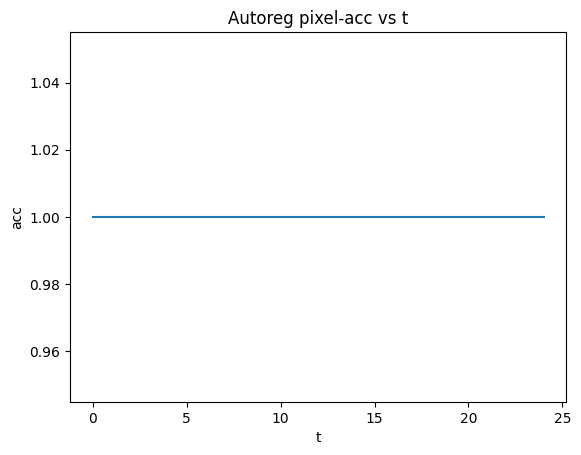

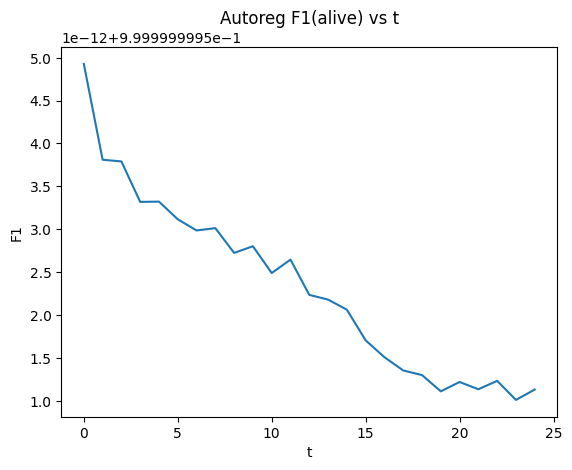

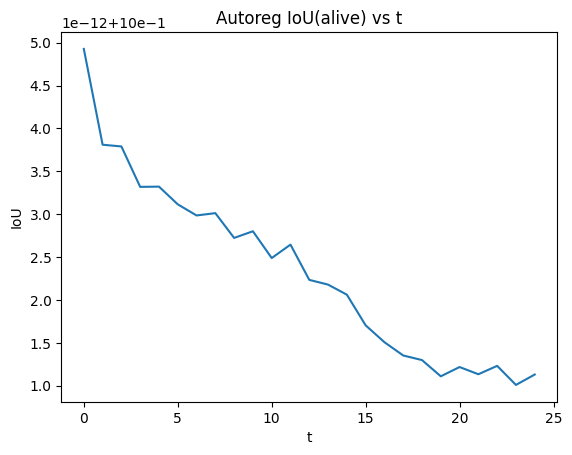

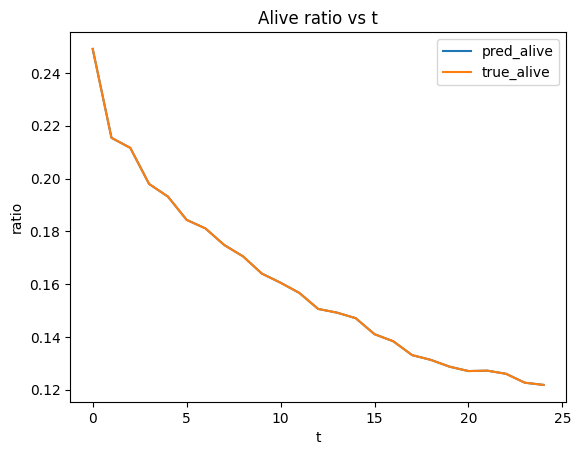

In [ ]:
bench = autoreg_benchmark(
    model,
    T=25,
    n_cases=64,        # plus robuste
    H=32, W=32,
    k_support=4,
    n_steps_got=N_STEPS,
    show_curves=True
)



In [ ]:
save_path = "/content/drive/MyDrive/goter_conway_tf2_epoch11.pt"
torch.save({
    "model_state": model.state_dict(),
    "epoch": 11,
    "config": {
        "H": 32, "W": 32,
        "k_support": 4,
        "z_dim": 32,
        "hidden": 64,
        "n_steps": N_STEPS,
        "tf2_weight": 0.5,
        "pos_weight_clamp": 12.0,
    }
}, save_path)
print("Saved checkpoint:", save_path)


Saved checkpoint: /content/drive/MyDrive/goter_conway_tf2_epoch11.pt


# Loading

In [ ]:
ckpt = torch.load('/content/drive/MyDrive/goter_conway_tf2_epoch11.pt', map_location=device)
model.load_state_dict(ckpt["model_state"])
model.to(device)
model.eval()
print("Loaded:", ckpt["config"])

Loaded: {'H': 32, 'W': 32, 'k_support': 4, 'z_dim': 32, 'hidden': 64, 'n_steps': 3, 'tf2_weight': 0.5, 'pos_weight_clamp': 12.0}


# ____________________________________________________________________________
# ____________________________________________________________________________

# Patch : benchmark autoreg avec support indépendant

In [ ]:
@torch.no_grad()
def autoreg_benchmark_independent_support(model, T=25, n_cases=64, H=32, W=32,
                                          p_range=(0.12,0.35), k_support=4, n_steps_got=3):
    model.eval()

    accs=[]; f1s=[]; ious=[]; exacts=[]
    for _ in range(n_cases):
        # support grid (independent)
        ps = random.uniform(*p_range)
        x0s = (torch.rand(1,1,H,W) < ps).float().to(device)
        sx, sy = make_support_from_x0(x0s, k_support=k_support, t_max=max(10,k_support+1))
        sx, sy = sx.to(device), sy.to(device)

        # query grid (different)
        pq = random.uniform(*p_range)
        x0q = (torch.rand(1,1,H,W) < pq).float().to(device)
        xs_true = conway_rollout_true(x0q, T=T)

        x = x0q
        for t in range(T):
            logits, _, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), x, n_steps=n_steps_got)
            x_next = (torch.sigmoid(logits) > 0.5).float()
            y_true = xs_true[t+1]

            pix_acc = (x_next == y_true).float().mean().item()
            exact = ((x_next == y_true).view(1,-1).all(dim=1)).float().item()
            prec, rec, f1, iou = alive_stats(x_next, y_true)

            accs.append(pix_acc); exacts.append(exact); f1s.append(f1); ious.append(iou)
            x = x_next

    print(f"[INDEP SUPPORT AUTOREG] acc={sum(accs)/len(accs)*100:.2f}% | "
          f"F1={sum(f1s)/len(f1s)*100:.2f}% | IoU={sum(ious)/len(ious)*100:.2f}% | "
          f"exact={sum(exacts)/len(exacts)*100:.2f}%")

# run
autoreg_benchmark_independent_support(model, T=25, n_cases=64, H=32, W=32, k_support=4, n_steps_got=N_STEPS)


[INDEP SUPPORT AUTOREG] acc=100.00% | F1=100.00% | IoU=100.00% | exact=100.00%


“GoT-ER induces a latent program
𝑍
Z from support transitions and executes it as an endomorphic operator on a belief state. On Conway’s Game of Life, the learned operator generalizes to unseen initial conditions and remains stable under long autoregressive rollouts. Importantly, it succeeds even when the support set is sampled from a different initial condition than the query, indicating rule-level generalization rather than memorization.”

In [ ]:
autoreg_benchmark_independent_support(model, T=100, n_cases=64, H=40, W=40, k_support=4, n_steps_got=N_STEPS)


[INDEP SUPPORT AUTOREG] acc=100.00% | F1=100.00% | IoU=100.00% | exact=100.00%


# PDE

#### We model a conditional PDE solver, where the governing operator is implicitly specified by a small set of input–output state transitions (support), and then applied to a query state.

# Cell 1 — Heat equation : simulateur (diffusion 2D) + générateur d’épisodes

#### On simule : 𝑢𝑡+1=𝑢𝑡+𝛼Δ𝑢𝑡	​ (schéma explicite), bords “zero-flux” via padding reflect.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import random
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

@torch.no_grad()
def heat_step(u, alpha=0.15):
    """
    u: (B,1,H,W) float
    alpha: dt*k/dx^2 (doit rester petit pour stabilité)
    """
    lap_kernel = torch.tensor([[0,1,0],
                               [1,-4,1],
                               [0,1,0]], dtype=u.dtype, device=u.device).view(1,1,3,3)
    # padding reflect ~ Neumann
    u_pad = F.pad(u, (1,1,1,1), mode="reflect")
    lap = F.conv2d(u_pad, lap_kernel)
    return u + alpha * lap

@torch.no_grad()
def heat_rollout(u0, T=20, alpha=0.15):
    xs = [u0]
    u = u0
    for _ in range(T):
        u = heat_step(u, alpha=alpha)
        xs.append(u)
    return xs  # len T+1

@torch.no_grad()
def sample_u0(batch=1, H=32, W=32, n_blobs=(1,4), amp=(0.5, 1.5), sigma=(1.0, 4.0)):
    """
    Conditions initiales = somme de quelques blobs gaussiens (variété visuelle)
    """
    yy, xx = torch.meshgrid(torch.arange(H), torch.arange(W), indexing="ij")
    yy = yy.float()[None,None,:,:]
    xx = xx.float()[None,None,:,:]

    u = torch.zeros(batch,1,H,W)
    for b in range(batch):
        nb = random.randint(*n_blobs)
        ub = torch.zeros(1,1,H,W)
        for _ in range(nb):
            cy = random.uniform(0, H-1)
            cx = random.uniform(0, W-1)
            a = random.uniform(*amp)
            s = random.uniform(*sigma)
            blob = a * torch.exp(-((yy-cy)**2 + (xx-cx)**2)/(2*s*s))
            ub = ub + blob
        u[b:b+1] = ub
    # normalise (optionnel)
    u = u / (u.amax(dim=[2,3], keepdim=True) + 1e-6)
    return u

def make_heat_episode(H=32, W=32, k_support=4, t_max=20, alpha=0.15):
    """
    Retourne (sx,sy,qx,qy) comme Conway mais continu.
    sx,sy: (S,1,H,W)
    qx,qy: (B=1,1,H,W) => on batchera au collate
    """
    u0 = sample_u0(batch=1, H=H, W=W)
    seq = heat_rollout(u0, T=t_max, alpha=alpha)

    support_pairs = []
    for _ in range(k_support):
        t = random.randint(0, t_max-1)
        support_pairs.append((seq[t], seq[t+1]))
    tq = random.randint(0, t_max-1)
    qx, qy = seq[tq], seq[tq+1]

    sx = torch.cat([p[0] for p in support_pairs], dim=0)  # (S,1,H,W)
    sy = torch.cat([p[1] for p in support_pairs], dim=0)
    return sx, sy, qx, qy


Using device: cuda


# Cell 2 — Dataset + loaders (train/eval mêmes lois, init disjoints)

In [ ]:
class HeatMetaDataset(Dataset):
    def __init__(self, split="train", n_episodes=20000, H=32, W=32, k_support=4, t_max=20, alpha=0.15):
        self.split = split
        self.n = n_episodes
        self.H, self.W = H, W
        self.k_support = k_support
        self.t_max = t_max
        self.alpha = alpha

        # disjonction légère train/eval (mais même PDE)
        if split == "train":
            self.n_blobs = (1,4); self.amp=(0.5,1.5); self.sigma=(1.0,4.0)
        else:
            self.n_blobs = (3,7); self.amp=(0.8,2.0); self.sigma=(2.5,7.0)

    def __len__(self): return self.n

    def __getitem__(self, idx):
        # surcharge sample_u0 params via monkey patch local
        u0 = sample_u0(batch=1, H=self.H, W=self.W,
                       n_blobs=self.n_blobs, amp=self.amp, sigma=self.sigma)
        seq = heat_rollout(u0, T=self.t_max, alpha=self.alpha)

        support_pairs = []
        for _ in range(self.k_support):
            t = random.randint(0, self.t_max-1)
            support_pairs.append((seq[t], seq[t+1]))
        tq = random.randint(0, self.t_max-1)
        qx, qy = seq[tq], seq[tq+1]

        sx = torch.cat([p[0] for p in support_pairs], dim=0)
        sy = torch.cat([p[1] for p in support_pairs], dim=0)
        return sx, sy, qx, qy

def collate_meta(batch):
    sxs, sys, qxs, qys = zip(*batch)
    support_x = torch.stack(sxs, dim=0)   # (B,S,1,H,W)
    support_y = torch.stack(sys, dim=0)
    query_x   = torch.cat(qxs, dim=0)     # (B,1,H,W)
    query_y   = torch.cat(qys, dim=0)
    return support_x, support_y, query_x, query_y

H=W=32
k_support=4
alpha=0.15

train_loader = DataLoader(
    HeatMetaDataset("train", n_episodes=20000, H=H, W=W, k_support=k_support, t_max=20, alpha=alpha),
    batch_size=16, shuffle=True, num_workers=0, collate_fn=collate_meta
)
eval_loader = DataLoader(
    HeatMetaDataset("eval", n_episodes=2000, H=H, W=W, k_support=k_support, t_max=30, alpha=alpha),
    batch_size=16, shuffle=False, num_workers=0, collate_fn=collate_meta
)


# Cell 3 — GoT-ER Heat : Ψ induit
𝑍
Z, Φ applique opérateur local continu

```python
        Supports (u_t , u_{t+1})
                |
                v
     +----------------------------+
     |   Support Encoder (Conv)   |
     +----------------------------+
                |
                v
        Initial Program Z₀
                |
                v
     +----------------------------+
     |  Program Inducer Ψθ        |
     |  (Evidence + GRUCell)      |
     +----------------------------+
                |
                v
             Program Zₜ
                |
                v
   +--------------------------------------+
   |  Local Heat Operator Φθ              |
   |  predicts Δu from 3×3 patch + Zₜ     |
   +--------------------------------------+
                |
                v
        State Update (Euler step)
           u_{t+1} = u_t + Δu
                |
                |  iteration t = 0 … T
                └───────────────────↺
```python

🧠 Annotations IERM

𝑠𝑡=𝑢𝑡	​ : reasoning state (temperature field)
Zt	​ : latent diffusion operator

Φθ : learned local differential operator

Iteration = temporal rollout (simulation)

Ψθ : operator induction from observed transitions


The Heat diffusion model instantiates IERM in a continuous setting, where the reasoning state corresponds to a physical field and the endomorphic executor learns a local differential operator. Program induction operates over observed state transitions, enabling the model to infer and iteratively apply a latent diffusion operator through time. This formulation closely mirrors classical numerical integration schemes while remaining fully learned and differentiable.

# 1️⃣ Mapping formel  → IERM

#### Espaces -> Supports : (xi​,yi​)≡(sx,sy) (où 𝑥𝑖=𝑢𝑡​ et yi​=ut+1) , query : x≡qx=u0​

#### Reasoning state S ->
```python
s = qx
...
du = self.phi(s, z)
s = s + du

```
## st​=ut​∈RH×W état continu (champ de température)

## Program space 𝑍 -> Zt​∈Rzdim encode coefficients de diffusion implicites et structure locale de l’opérateur Zt	​⊂End(S)

| IERM           | Code                       |
| -------------- | -------------------------- |
| Ψθ             | `ProgramInducerHeat`       |
| Encoder        | `SupportEncoderHeat`       |
| Evidence (E_t) | `evidence(sx, sy, sy_hat)` |
| U_Z            | `GRUCell(dz, z)`           |


## Point clé -> Evidence compare : 𝑢𝑡  →  𝑢𝑡+1 Donc Ψ apprend l’opérateur de transition, pas une sortie statique.

## 👉 C’est exactement le cœur de l’induction d’opérateur.

## Φθ — Endomorphic Executor (Heat)
```python
class LocalHeatOperator(nn.Module):
```
#### Φ prend : patch local 3×3de 𝑢𝑡 programme latent 𝑍𝑡 ​ Φθ​(ut​;Zt​)=Δut​ => ut+1​=ut​+Φθ​(ut​;Zt​)

## ✔️ endomorphisme pur sur un champ continu

## 3️⃣ Dynamique IERM explicite

##### rollout implémente : Zt+1 = UZ​(Zt​,Et​)  ut+1=ut​+Φθ​(ut​;Zt​)

##### Avec :𝐸𝑡	​ calculée uniquement sur les supportsaucune correction directe et ut	​ par l’erreur
	​



In [ ]:
# 1️⃣ Mapping formel  → IERM

In [ ]:
class SupportEncoderHeat(nn.Module):
    def __init__(self, z_dim=32):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(2, 16, 3, padding=1), nn.ReLU(),
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(),
        )
        self.fc = nn.Linear(32, z_dim)

    def forward(self, sx, sy):
        # sx,sy: (B,S,1,H,W)
        B,S,_,H,W = sx.shape
        h = torch.cat([sx, sy], dim=2).view(B*S, 2, H, W)
        h = self.conv(h).mean(dim=[2,3])          # (B*S,32)
        z = self.fc(h).view(B,S,-1).mean(dim=1)   # (B,z)
        return z

class LocalHeatOperator(nn.Module):
    """
    Φ: prend patch 3x3 de u_t + z => prédit Δu (scalaire) pour la cellule centrale.
    """
    def __init__(self, z_dim=32, hidden=64):
        super().__init__()
        self.mlp = nn.Sequential(
            nn.Linear(9 + z_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, 1)
        )

    def forward(self, u, z):
        # u: (B,1,H,W), z: (B,z)
        B,_,H,W = u.shape
        patches = F.unfold(u, kernel_size=3, padding=1)          # (B,9,H*W)
        patches = patches.transpose(1,2).reshape(-1, 9)          # (B*H*W,9)
        z_expand = z[:,None,:].expand(B, H*W, z.size(-1)).reshape(B*H*W, -1)
        du = self.mlp(torch.cat([patches, z_expand], dim=1)).view(B,1,H,W)
        return du

class ProgramInducerHeat(nn.Module):
    def __init__(self, z_dim=32, feat_dim=6):
        super().__init__()
        self.encoder = SupportEncoderHeat(z_dim=z_dim)
        self.feat = nn.Sequential(nn.Linear(feat_dim, 64), nn.ReLU(), nn.Linear(64, z_dim))
        self.gru = nn.GRUCell(z_dim, z_dim)

    @staticmethod
    def evidence(sx, sy, sy_hat):
        # sx,sy,sy_hat: (B,S,1,H,W)
        err = (sy_hat - sy)
        feats = torch.stack([
            err.abs().mean(dim=[1,2,3,4]),
            (err**2).mean(dim=[1,2,3,4]),
            sx.mean(dim=[1,2,3,4]),
            sy.mean(dim=[1,2,3,4]),
            sy_hat.mean(dim=[1,2,3,4]),
            (sy_hat - sx).abs().mean(dim=[1,2,3,4]),
        ], dim=1)
        return feats

    def forward(self, sx, sy, phi, z=None):
        if z is None:
            z = self.encoder(sx, sy)  # (B,z)
        B,S,_,H,W = sx.shape
        sx_flat = sx.view(B*S,1,H,W)
        z_flat  = z[:,None,:].expand(B,S,z.size(-1)).contiguous().view(B*S,-1)

        du_hat = phi(sx_flat, z_flat).view(B,S,1,H,W)
        sy_hat = sx + du_hat
        feats = self.evidence(sx, sy, sy_hat)
        dz = self.feat(feats)
        z_next = self.gru(dz, z)
        return z_next, sy_hat

class GoTERHeat(nn.Module):
    def __init__(self, z_dim=32, hidden=64):
        super().__init__()
        self.phi = LocalHeatOperator(z_dim=z_dim, hidden=hidden)
        self.psi = ProgramInducerHeat(z_dim=z_dim)

    def rollout(self, sx, sy, qx, n_steps=3):
        """
        belief state s = u (continu)
        """
        s = qx
        z = None
        for _ in range(n_steps):
            z, sy_hat = self.psi(sx, sy, self.phi, z=z)
            du = self.phi(s, z)
            s = s + du
        return s, z  # s ~ u_next


# InsT

In [ ]:
model = GoTERHeat(z_dim=32, hidden=64).to(device)
print("Params:", sum(p.numel() for p in model.parameters()))


Params: 17617


# Visualisation Heat : GT vs Pred vs Error (rollout)

In [ ]:
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

@torch.no_grad()
def viz_heat_rollout(model, T=20, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                     train_support_dist=True):
    """
    Visualise un rollout:
    - Support indépendant (u0s) -> (sx,sy)
    - Query (u0q) -> rollout exact vs rollout model
    Affiche GT / Pred / |Err| pour t=1..T
    """
    model.eval()

    # --- Support ---
    if train_support_dist:
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(1,4), amp=(0.5,1.5), sigma=(1.0,4.0)).to(device)
    else:
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)

    seq_s = heat_rollout(u0s, T=max(10, k_support+1), alpha=alpha)
    sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)      # (S,1,H,W)
    sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)

    # --- Query ---
    u0q = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)
    true = heat_rollout(u0q, T=T, alpha=alpha)

    # --- Pred rollout ---
    pred = [u0q]
    u = u0q
    for t in range(T):
        u_next, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), u, n_steps=n_steps_got)
        pred.append(u_next)
        u = u_next

    # --- Metrics ---
    mses, maes = [], []
    for t in range(1, T+1):
        mse = F.mse_loss(pred[t], true[t]).item()
        mae = (pred[t] - true[t]).abs().mean().item()
        mses.append(mse); maes.append(mae)
    print(f"[VIZ] T={T} | avg MSE={sum(mses)/len(mses):.6f} | avg MAE={sum(maes)/len(maes):.6f}")
    print("First/last step:", f"MSE t=1 {mses[0]:.6f} -> t={T} {mses[-1]:.6f}",
          "|", f"MAE t=1 {maes[0]:.6f} -> t={T} {maes[-1]:.6f}")

    # --- Plot grids ---
    # On affiche quelques pas représentatifs (sinon trop de figures)
    steps_to_show = [1, 2, 5, 10, T] if T >= 10 else list(range(1, T+1))

    for t in steps_to_show:
        gt = true[t][0,0].detach().cpu()
        pr = pred[t][0,0].detach().cpu()
        er = (pr - gt).abs()

        fig, axs = plt.subplots(1, 3, figsize=(10, 3))
        axs[0].imshow(gt, cmap="viridis"); axs[0].set_title(f"GT (t={t})"); axs[0].axis("off")
        axs[1].imshow(pr, cmap="viridis"); axs[1].set_title(f"Pred (t={t})"); axs[1].axis("off")
        axs[2].imshow(er, cmap="magma");   axs[2].set_title(f"|Error| (t={t})"); axs[2].axis("off")
        plt.tight_layout()
        plt.show()

    # Option: courbes d’erreur
    plt.figure(); plt.plot(mses); plt.title("MSE vs t"); plt.xlabel("t"); plt.ylabel("MSE"); plt.show()
    plt.figure(); plt.plot(maes); plt.title("MAE vs t"); plt.xlabel("t"); plt.ylabel("MAE"); plt.show()


# Exemple d'appel (pendant ou après training):
# viz_heat_rollout(model, T=20, H=H, W=W, k_support=k_support, n_steps_got=N_STEPS, alpha=alpha)


# Cell 4 — Train (TF-2) + tqdm (Heat)

On fait comme Conway TF-2 :

step1 :
𝑢
𝑡
→
𝑢
𝑡
+
1
u
t
	​

→u
t+1
	​


step2 TF :
𝑢
𝑡
+
1
→
𝑢
𝑡
+
2
u
t+1
	​

→u
t+2
	​

 (via simulateur exact)

Perte : Huber (smooth L1) sur les champs.

In [ ]:
import time
import torch
import torch.nn.functional as F
import torch.optim as optim
from tqdm.auto import tqdm

def huber(a, b, delta=0.02):
    return F.smooth_l1_loss(a, b, beta=delta)

@torch.no_grad()
def autoreg_mini_heat(model, T=20, n_cases=8, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15):
    """
    Mini-benchmark autoreg (support indep) -> retourne avg MSE/MAE.
    Très léger pour être appelé pendant le train.
    """
    model.eval()
    mses, maes = [], []

    for _ in range(n_cases):
        # support init (train-ish)
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(1,4), amp=(0.5,1.5), sigma=(1.0,4.0)).to(device)
        seq_s = heat_rollout(u0s, T=max(10, k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0).to(device)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0).to(device)

        # query init (eval-ish)
        u0q = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)
        true = heat_rollout(u0q, T=T, alpha=alpha)

        u = u0q
        for t in range(T):
            u_next, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), u, n_steps=n_steps_got)
            y_true = true[t+1]
            mses.append(F.mse_loss(u_next, y_true).item())
            maes.append((u_next - y_true).abs().mean().item())
            u = u_next

    return sum(mses)/len(mses), sum(maes)/len(maes)

@torch.no_grad()
def eval_quick_heat_rich(model, loader, n_steps=3, max_batches=10, tf2_weight=0.5, alpha=0.15):
    model.eval()
    tot, tot1, tot2, n = 0.0, 0.0, 0.0, 0
    it = 0

    for sx, sy, qx, qy in loader:
        sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)

        # step1
        y1, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
        loss1 = huber(y1, qy)

        # step2 TF
        qy2 = heat_step(qy, alpha=alpha)
        y2, _ = model.rollout(sx, sy, qy, n_steps=n_steps)
        loss2 = huber(y2, qy2)

        loss = loss1 + tf2_weight * loss2

        bs = qx.size(0)
        tot += loss.item() * bs
        tot1 += loss1.item() * bs
        tot2 += loss2.item() * bs
        n += bs

        it += 1
        if it >= max_batches:
            break

    return tot/n, tot1/n, tot2/n


def train_heat_tf2_rich(model, train_loader, eval_loader,
                        epochs=20, lr=3e-4, n_steps=3,
                        log_every=20, eval_every=200, quick_eval_batches=5,
                        tf2_weight=0.5, alpha=0.15,
                        do_autoreg_every=400, autoreg_T=20, autoreg_cases=6,
                        show_viz_each_epoch=False):
    """
    Train loop riche:
    - affiche loss total + loss1 + loss2
    - quick eval périodique (loss total/1/2)
    - mini autoreg périodique (MSE/MAE sur rollout)
    - option visu fin d'epoch (si tu veux)
    """
    opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-4)

    hist = {
        "train_loss": [], "train_loss1": [], "train_loss2": [],
        "eval_loss": [],  "eval_loss1": [],  "eval_loss2": [],
        "autoreg_mse": [], "autoreg_mae": []
    }

    global_step = 0
    for ep in range(1, epochs+1):
        model.train()
        running, running1, running2, seen = 0.0, 0.0, 0.0, 0
        pbar = tqdm(train_loader, desc=f"Heat Epoch {ep}/{epochs}", leave=True)
        t0 = time.time()

        for batch_idx, (sx, sy, qx, qy) in enumerate(pbar, start=1):
            global_step += 1
            sx, sy, qx, qy = sx.to(device), sy.to(device), qx.to(device), qy.to(device)
            opt.zero_grad()

            # step1
            y1, _ = model.rollout(sx, sy, qx, n_steps=n_steps)
            loss1 = huber(y1, qy)

            # step2 TF
            qy2 = heat_step(qy, alpha=alpha)
            y2, _ = model.rollout(sx, sy, qy, n_steps=n_steps)
            loss2 = huber(y2, qy2)

            loss = loss1 + tf2_weight * loss2
            loss.backward()
            opt.step()

            bs = qx.size(0)
            running += loss.item() * bs
            running1 += loss1.item() * bs
            running2 += loss2.item() * bs
            seen += bs

            avg  = running/seen
            avg1 = running1/seen
            avg2 = running2/seen

            pbar.set_postfix({
                "loss": f"{avg:.4f}",
                "l1": f"{avg1:.4f}",
                "l2": f"{avg2:.4f}",
                "it/s": f"{(batch_idx/(time.time()-t0+1e-9)):.2f}"
            })

            if batch_idx % log_every == 0:
                dt = time.time()-t0
                print(f"[ep {ep} | it {batch_idx}] loss={avg:.5f} (l1={avg1:.5f}, l2={avg2:.5f})  ({dt:.1f}s)")

            # quick eval
            if global_step % eval_every == 0:
                ev, ev1, ev2 = eval_quick_heat_rich(model, eval_loader, n_steps=n_steps,
                                                    max_batches=quick_eval_batches,
                                                    tf2_weight=tf2_weight, alpha=alpha)
                print(f"  -> quick-eval: loss={ev:.5f} (l1={ev1:.5f}, l2={ev2:.5f}) on {quick_eval_batches} batches")
                model.train()

            # mini autoreg
            if do_autoreg_every and (global_step % do_autoreg_every == 0):
                mse, mae = autoreg_mini_heat(model, T=autoreg_T, n_cases=autoreg_cases,
                                             H=H, W=W, k_support=k_support, n_steps_got=n_steps, alpha=alpha)
                print(f"  -> autoreg-mini: T={autoreg_T} MSE={mse:.6f} MAE={mae:.6f} (cases={autoreg_cases})")
                model.train()

        # end epoch eval
        ev, ev1, ev2 = eval_quick_heat_rich(model, eval_loader, n_steps=n_steps,
                                            max_batches=max(quick_eval_batches, 20),
                                            tf2_weight=tf2_weight, alpha=alpha)
        tr  = running/seen
        tr1 = running1/seen
        tr2 = running2/seen

        hist["train_loss"].append(tr); hist["train_loss1"].append(tr1); hist["train_loss2"].append(tr2)
        hist["eval_loss"].append(ev);  hist["eval_loss1"].append(ev1);  hist["eval_loss2"].append(ev2)

        # autoreg at end epoch (light)
        mse, mae = autoreg_mini_heat(model, T=autoreg_T, n_cases=max(autoreg_cases, 8),
                                     H=H, W=W, k_support=k_support, n_steps_got=n_steps, alpha=alpha)
        hist["autoreg_mse"].append(mse); hist["autoreg_mae"].append(mae)

        print(f"Heat Epoch {ep:03d} DONE | train {tr:.5f} (l1={tr1:.5f}, l2={tr2:.5f}) | "
              f"eval {ev:.5f} (l1={ev1:.5f}, l2={ev2:.5f}) | autoreg MSE={mse:.6f} MAE={mae:.6f}")

        if show_viz_each_epoch:
            viz_heat_rollout(model, T=20, H=H, W=W, k_support=k_support, n_steps_got=n_steps, alpha=alpha)

    return hist


In [ ]:
EPOCHS = 20
N_STEPS = 3

hist_heat_rich = train_heat_tf2_rich(
    model, train_loader, eval_loader,
    epochs=EPOCHS, lr=3e-4, n_steps=N_STEPS,
    log_every=20, eval_every=200, quick_eval_batches=5,
    tf2_weight=0.5, alpha=alpha,
    do_autoreg_every=400, autoreg_T=20, autoreg_cases=6,
    show_viz_each_epoch=False
)


Heat Epoch 1/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 1 | it 20] loss=0.00289 (l1=0.00194, l2=0.00191)  (1.4s)
[ep 1 | it 40] loss=0.00171 (l1=0.00115, l2=0.00113)  (2.8s)
[ep 1 | it 60] loss=0.00120 (l1=0.00081, l2=0.00079)  (3.8s)
[ep 1 | it 80] loss=0.00094 (l1=0.00063, l2=0.00061)  (4.8s)
[ep 1 | it 100] loss=0.00077 (l1=0.00052, l2=0.00050)  (5.8s)
[ep 1 | it 120] loss=0.00067 (l1=0.00045, l2=0.00043)  (6.8s)
[ep 1 | it 140] loss=0.00059 (l1=0.00040, l2=0.00038)  (7.7s)
[ep 1 | it 160] loss=0.00053 (l1=0.00036, l2=0.00034)  (8.7s)
[ep 1 | it 180] loss=0.00049 (l1=0.00033, l2=0.00031)  (9.7s)
[ep 1 | it 200] loss=0.00045 (l1=0.00031, l2=0.00029)  (10.7s)
  -> quick-eval: loss=0.00038 (l1=0.00026, l2=0.00024) on 5 batches
[ep 1 | it 220] loss=0.00042 (l1=0.00029, l2=0.00027)  (11.9s)
[ep 1 | it 240] loss=0.00040 (l1=0.00027, l2=0.00025)  (13.0s)
[ep 1 | it 260] loss=0.00038 (l1=0.00026, l2=0.00024)  (14.4s)
[ep 1 | it 280] loss=0.00036 (l1=0.00024, l2=0.00023)  (15.8s)
[ep 1 | it 300] loss=0.00034 (l1=0.00023, l2=0.00021)  (16.8s)


Heat Epoch 2/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 2 | it 20] loss=0.00006 (l1=0.00004, l2=0.00003)  (1.0s)
[ep 2 | it 40] loss=0.00006 (l1=0.00004, l2=0.00003)  (2.0s)
[ep 2 | it 60] loss=0.00006 (l1=0.00004, l2=0.00003)  (3.0s)
[ep 2 | it 80] loss=0.00005 (l1=0.00004, l2=0.00003)  (4.0s)
[ep 2 | it 100] loss=0.00005 (l1=0.00004, l2=0.00003)  (5.0s)
[ep 2 | it 120] loss=0.00006 (l1=0.00004, l2=0.00003)  (6.0s)
[ep 2 | it 140] loss=0.00006 (l1=0.00004, l2=0.00003)  (7.0s)
  -> quick-eval: loss=0.00018 (l1=0.00012, l2=0.00012) on 5 batches
[ep 2 | it 160] loss=0.00006 (l1=0.00004, l2=0.00003)  (8.7s)
[ep 2 | it 180] loss=0.00006 (l1=0.00004, l2=0.00003)  (10.0s)
[ep 2 | it 200] loss=0.00006 (l1=0.00004, l2=0.00003)  (11.0s)
[ep 2 | it 220] loss=0.00006 (l1=0.00004, l2=0.00003)  (12.0s)
[ep 2 | it 240] loss=0.00005 (l1=0.00004, l2=0.00003)  (13.0s)
[ep 2 | it 260] loss=0.00005 (l1=0.00004, l2=0.00003)  (14.0s)
[ep 2 | it 280] loss=0.00005 (l1=0.00004, l2=0.00003)  (15.0s)
[ep 2 | it 300] loss=0.00005 (l1=0.00004, l2=0.00003)  (16.0s)

Heat Epoch 3/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 3 | it 20] loss=0.00002 (l1=0.00002, l2=0.00001)  (1.1s)
[ep 3 | it 40] loss=0.00004 (l1=0.00002, l2=0.00002)  (2.2s)
[ep 3 | it 60] loss=0.00003 (l1=0.00002, l2=0.00002)  (3.6s)
[ep 3 | it 80] loss=0.00003 (l1=0.00002, l2=0.00002)  (5.0s)
[ep 3 | it 100] loss=0.00003 (l1=0.00002, l2=0.00002)  (6.1s)
  -> quick-eval: loss=0.00011 (l1=0.00008, l2=0.00007) on 5 batches
[ep 3 | it 120] loss=0.00003 (l1=0.00002, l2=0.00002)  (7.4s)
[ep 3 | it 140] loss=0.00003 (l1=0.00002, l2=0.00002)  (8.4s)
[ep 3 | it 160] loss=0.00003 (l1=0.00002, l2=0.00002)  (9.5s)
[ep 3 | it 180] loss=0.00003 (l1=0.00002, l2=0.00002)  (10.5s)
[ep 3 | it 200] loss=0.00003 (l1=0.00002, l2=0.00002)  (11.5s)
[ep 3 | it 220] loss=0.00003 (l1=0.00002, l2=0.00002)  (12.5s)
[ep 3 | it 240] loss=0.00003 (l1=0.00002, l2=0.00002)  (13.5s)
[ep 3 | it 260] loss=0.00003 (l1=0.00002, l2=0.00001)  (14.6s)
[ep 3 | it 280] loss=0.00003 (l1=0.00002, l2=0.00001)  (15.8s)
[ep 3 | it 300] loss=0.00003 (l1=0.00002, l2=0.00001)  (17.2s)

Heat Epoch 4/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 4 | it 20] loss=0.00002 (l1=0.00001, l2=0.00001)  (1.0s)
[ep 4 | it 40] loss=0.00002 (l1=0.00001, l2=0.00001)  (2.1s)
  -> quick-eval: loss=0.00011 (l1=0.00007, l2=0.00007) on 5 batches
[ep 4 | it 60] loss=0.00002 (l1=0.00001, l2=0.00001)  (3.4s)
[ep 4 | it 80] loss=0.00002 (l1=0.00001, l2=0.00001)  (4.3s)
[ep 4 | it 100] loss=0.00002 (l1=0.00001, l2=0.00001)  (5.4s)
[ep 4 | it 120] loss=0.00002 (l1=0.00001, l2=0.00001)  (6.4s)
[ep 4 | it 140] loss=0.00002 (l1=0.00001, l2=0.00001)  (7.4s)
[ep 4 | it 160] loss=0.00002 (l1=0.00001, l2=0.00001)  (8.6s)
[ep 4 | it 180] loss=0.00002 (l1=0.00001, l2=0.00001)  (10.0s)
[ep 4 | it 200] loss=0.00002 (l1=0.00001, l2=0.00001)  (11.3s)
[ep 4 | it 220] loss=0.00002 (l1=0.00002, l2=0.00001)  (12.3s)
[ep 4 | it 240] loss=0.00002 (l1=0.00002, l2=0.00001)  (13.4s)
  -> quick-eval: loss=0.00007 (l1=0.00005, l2=0.00004) on 5 batches
  -> autoreg-mini: T=20 MSE=0.000079 MAE=0.006505 (cases=6)
[ep 4 | it 260] loss=0.00002 (l1=0.00002, l2=0.00001)  (15.0

Heat Epoch 5/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 5 | it 20] loss=0.00019 (l1=0.00013, l2=0.00013)  (1.1s)
[ep 5 | it 40] loss=0.00012 (l1=0.00008, l2=0.00008)  (2.3s)
[ep 5 | it 60] loss=0.00008 (l1=0.00006, l2=0.00005)  (3.7s)
[ep 5 | it 80] loss=0.00007 (l1=0.00004, l2=0.00004)  (5.0s)
[ep 5 | it 100] loss=0.00005 (l1=0.00004, l2=0.00004)  (6.0s)
[ep 5 | it 120] loss=0.00005 (l1=0.00003, l2=0.00003)  (7.0s)
[ep 5 | it 140] loss=0.00004 (l1=0.00003, l2=0.00003)  (8.0s)
[ep 5 | it 160] loss=0.00004 (l1=0.00003, l2=0.00002)  (9.0s)
[ep 5 | it 180] loss=0.00004 (l1=0.00002, l2=0.00002)  (10.0s)
[ep 5 | it 200] loss=0.00003 (l1=0.00002, l2=0.00002)  (11.1s)
  -> quick-eval: loss=0.00013 (l1=0.00009, l2=0.00009) on 5 batches
  -> autoreg-mini: T=20 MSE=0.000018 MAE=0.002649 (cases=6)
[ep 5 | it 220] loss=0.00003 (l1=0.00002, l2=0.00002)  (12.7s)
[ep 5 | it 240] loss=0.00003 (l1=0.00002, l2=0.00002)  (13.7s)
[ep 5 | it 260] loss=0.00003 (l1=0.00002, l2=0.00002)  (14.8s)
[ep 5 | it 280] loss=0.00003 (l1=0.00002, l2=0.00002)  (16.2s)
[e

Heat Epoch 6/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 6 | it 20] loss=0.00001 (l1=0.00001, l2=0.00000)  (1.0s)
[ep 6 | it 40] loss=0.00001 (l1=0.00001, l2=0.00001)  (2.1s)
[ep 6 | it 60] loss=0.00003 (l1=0.00002, l2=0.00002)  (3.1s)
[ep 6 | it 80] loss=0.00004 (l1=0.00003, l2=0.00003)  (4.1s)
[ep 6 | it 100] loss=0.00006 (l1=0.00004, l2=0.00004)  (5.1s)
[ep 6 | it 120] loss=0.00007 (l1=0.00005, l2=0.00005)  (6.1s)
[ep 6 | it 140] loss=0.00008 (l1=0.00005, l2=0.00005)  (7.1s)
  -> quick-eval: loss=0.00029 (l1=0.00019, l2=0.00019) on 5 batches
  -> autoreg-mini: T=20 MSE=0.000173 MAE=0.009614 (cases=6)
[ep 6 | it 160] loss=0.00007 (l1=0.00005, l2=0.00005)  (9.2s)
[ep 6 | it 180] loss=0.00006 (l1=0.00004, l2=0.00004)  (10.6s)
[ep 6 | it 200] loss=0.00006 (l1=0.00004, l2=0.00004)  (11.6s)
[ep 6 | it 220] loss=0.00005 (l1=0.00004, l2=0.00003)  (12.6s)
[ep 6 | it 240] loss=0.00005 (l1=0.00003, l2=0.00003)  (13.6s)
[ep 6 | it 260] loss=0.00005 (l1=0.00003, l2=0.00003)  (14.6s)
[ep 6 | it 280] loss=0.00004 (l1=0.00003, l2=0.00003)  (15.6s)
[e

Heat Epoch 7/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 7 | it 20] loss=0.00001 (l1=0.00001, l2=0.00000)  (1.1s)
[ep 7 | it 40] loss=0.00001 (l1=0.00001, l2=0.00001)  (2.4s)
[ep 7 | it 60] loss=0.00001 (l1=0.00001, l2=0.00001)  (3.7s)
[ep 7 | it 80] loss=0.00002 (l1=0.00001, l2=0.00001)  (5.0s)
[ep 7 | it 100] loss=0.00002 (l1=0.00002, l2=0.00001)  (6.0s)
  -> quick-eval: loss=0.00025 (l1=0.00017, l2=0.00017) on 5 batches
  -> autoreg-mini: T=20 MSE=0.000092 MAE=0.007492 (cases=6)
[ep 7 | it 120] loss=0.00003 (l1=0.00002, l2=0.00002)  (7.6s)
[ep 7 | it 140] loss=0.00003 (l1=0.00002, l2=0.00002)  (8.7s)
[ep 7 | it 160] loss=0.00002 (l1=0.00002, l2=0.00001)  (9.7s)
[ep 7 | it 180] loss=0.00002 (l1=0.00002, l2=0.00001)  (10.7s)
[ep 7 | it 200] loss=0.00002 (l1=0.00001, l2=0.00001)  (11.7s)
[ep 7 | it 220] loss=0.00002 (l1=0.00001, l2=0.00001)  (12.8s)
[ep 7 | it 240] loss=0.00002 (l1=0.00001, l2=0.00001)  (13.8s)
[ep 7 | it 260] loss=0.00002 (l1=0.00001, l2=0.00001)  (15.0s)
[ep 7 | it 280] loss=0.00002 (l1=0.00001, l2=0.00001)  (16.4s)
[e

Heat Epoch 8/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 8 | it 20] loss=0.00001 (l1=0.00001, l2=0.00001)  (1.1s)
[ep 8 | it 40] loss=0.00001 (l1=0.00001, l2=0.00001)  (2.1s)
  -> quick-eval: loss=0.00021 (l1=0.00014, l2=0.00014) on 5 batches
  -> autoreg-mini: T=20 MSE=0.000020 MAE=0.003259 (cases=6)
[ep 8 | it 60] loss=0.00001 (l1=0.00001, l2=0.00001)  (3.8s)
[ep 8 | it 80] loss=0.00001 (l1=0.00001, l2=0.00001)  (4.8s)
[ep 8 | it 100] loss=0.00001 (l1=0.00001, l2=0.00001)  (5.9s)
[ep 8 | it 120] loss=0.00001 (l1=0.00001, l2=0.00001)  (6.9s)
[ep 8 | it 140] loss=0.00001 (l1=0.00001, l2=0.00001)  (8.3s)
[ep 8 | it 160] loss=0.00001 (l1=0.00001, l2=0.00001)  (9.7s)
[ep 8 | it 180] loss=0.00001 (l1=0.00001, l2=0.00001)  (10.9s)
[ep 8 | it 200] loss=0.00001 (l1=0.00001, l2=0.00001)  (11.9s)
[ep 8 | it 220] loss=0.00002 (l1=0.00001, l2=0.00001)  (12.9s)
[ep 8 | it 240] loss=0.00002 (l1=0.00001, l2=0.00001)  (14.0s)
  -> quick-eval: loss=0.00227 (l1=0.00152, l2=0.00151) on 5 batches
[ep 8 | it 260] loss=0.00004 (l1=0.00003, l2=0.00002)  (15.2

Heat Epoch 9/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 9 | it 20] loss=0.00001 (l1=0.00000, l2=0.00000)  (1.4s)
[ep 9 | it 40] loss=0.00001 (l1=0.00000, l2=0.00000)  (2.9s)
[ep 9 | it 60] loss=0.00001 (l1=0.00001, l2=0.00000)  (4.0s)
[ep 9 | it 80] loss=0.00001 (l1=0.00001, l2=0.00000)  (5.0s)
[ep 9 | it 100] loss=0.00001 (l1=0.00001, l2=0.00000)  (6.0s)
[ep 9 | it 120] loss=0.00001 (l1=0.00001, l2=0.00001)  (7.1s)
[ep 9 | it 140] loss=0.00001 (l1=0.00001, l2=0.00001)  (8.1s)
[ep 9 | it 160] loss=0.00001 (l1=0.00001, l2=0.00001)  (9.1s)
[ep 9 | it 180] loss=0.00001 (l1=0.00001, l2=0.00001)  (10.2s)
[ep 9 | it 200] loss=0.00001 (l1=0.00001, l2=0.00001)  (11.2s)
  -> quick-eval: loss=0.00008 (l1=0.00005, l2=0.00005) on 5 batches
[ep 9 | it 220] loss=0.00001 (l1=0.00001, l2=0.00001)  (12.5s)
[ep 9 | it 240] loss=0.00001 (l1=0.00001, l2=0.00001)  (13.8s)
[ep 9 | it 260] loss=0.00001 (l1=0.00001, l2=0.00001)  (15.2s)
[ep 9 | it 280] loss=0.00001 (l1=0.00001, l2=0.00001)  (16.5s)
[ep 9 | it 300] loss=0.00001 (l1=0.00001, l2=0.00001)  (17.5s)

Heat Epoch 10/20:   0%|          | 0/1250 [00:00<?, ?it/s]

[ep 10 | it 20] loss=0.00001 (l1=0.00001, l2=0.00000)  (1.1s)


KeyboardInterrupt: 

In [ ]:
save_path = "/content/drive/MyDrive/goter_heat_best.pt"
torch.save({
    "model_state": model.state_dict(),
    "config": {"H":H,"W":W,"k_support":k_support,"z_dim":32,"hidden":64,"n_steps":N_STEPS,"tf2_weight":0.5,"alpha":alpha},
}, save_path)
print("Saved:", save_path)


Saved: /content/drive/MyDrive/goter_heat_best.pt


In [ ]:
ckpt = torch.load("/content/drive/MyDrive/goter_heat_best.pt", map_location=device)
model.load_state_dict(ckpt["model_state"])
model.to(device)
model.eval()
print("Loaded:", ckpt["config"])

Loaded: {'H': 32, 'W': 32, 'k_support': 4, 'z_dim': 32, 'hidden': 64, 'n_steps': 3, 'tf2_weight': 0.5, 'alpha': 0.15}


[HEAT AUTOREG indep] T=50 | avg MSE=0.000919 | avg MAE=0.014261


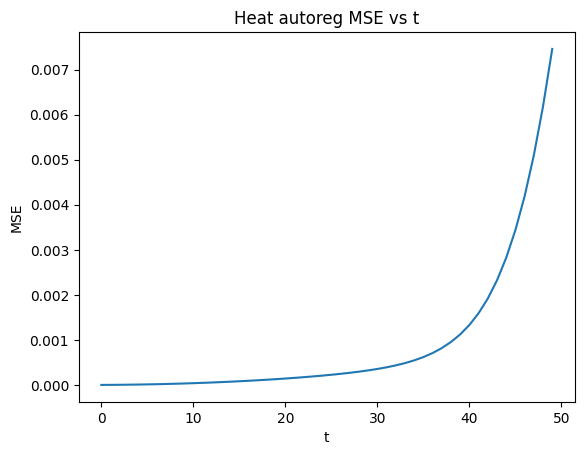

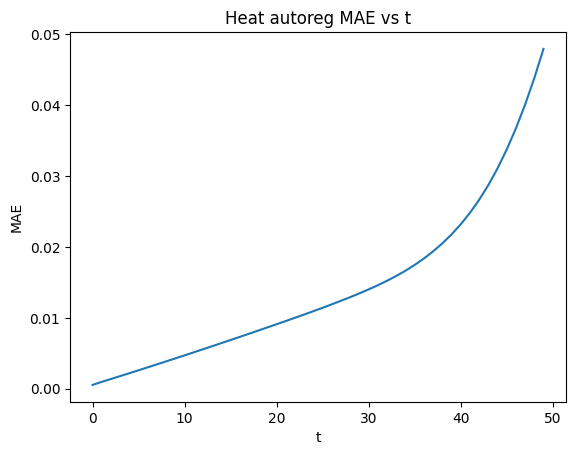

In [ ]:
bench_heat = autoreg_benchmark_heat_indep_support(
    model, T=50, n_cases=32, H=H, W=W,
    k_support=k_support, n_steps_got=N_STEPS, alpha=alpha
)


# Cell 5 — Benchmark autoregressif (support indépendant) pour Heat

[HEAT AUTOREG indep] T=50 | avg MSE=0.000885 | avg MAE=0.015476


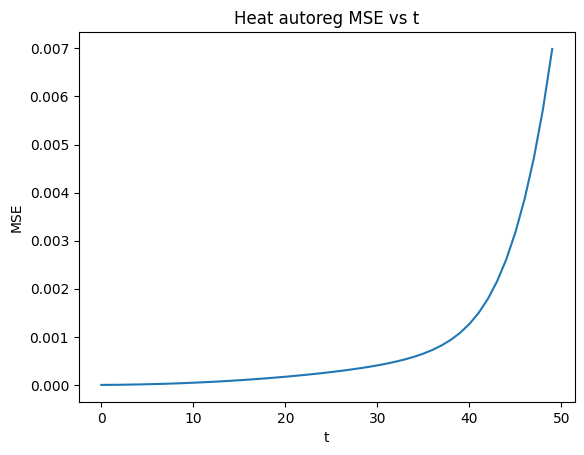

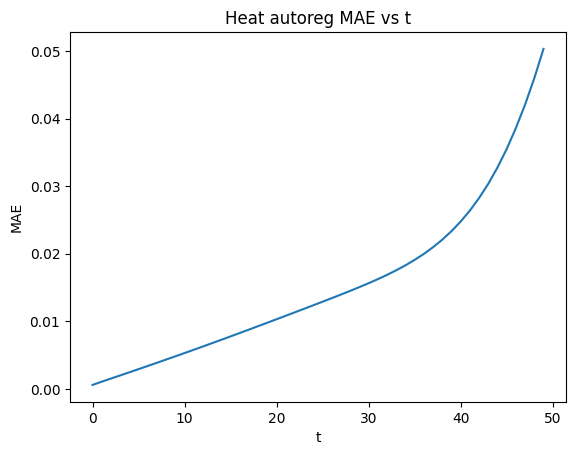

In [ ]:
@torch.no_grad()
def autoreg_benchmark_heat_indep_support(model, T=50, n_cases=32, H=32, W=32,
                                         k_support=4, n_steps_got=3, alpha=0.15):
    model.eval()
    mse_curve = []
    mae_curve = []
    for _ in range(T):
        mse_curve.append([])
        mae_curve.append([])

    for _ in range(n_cases):
        # support init
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(1,4), amp=(0.5,1.5), sigma=(1.0,4.0)).to(device)
        seq_s = heat_rollout(u0s, T=max(10,k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)

        # query init (indep)
        u0q = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)
        true = heat_rollout(u0q, T=T, alpha=alpha)

        u = u0q
        for t in range(T):
            u_next, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), u, n_steps=n_steps_got)
            y_true = true[t+1]
            mse = F.mse_loss(u_next, y_true).item()
            mae = (u_next - y_true).abs().mean().item()
            mse_curve[t].append(mse)
            mae_curve[t].append(mae)
            u = u_next

    mse_m = [sum(v)/len(v) for v in mse_curve]
    mae_m = [sum(v)/len(v) for v in mae_curve]

    print(f"[HEAT AUTOREG indep] T={T} | avg MSE={sum(mse_m)/len(mse_m):.6f} | avg MAE={sum(mae_m)/len(mae_m):.6f}")

    plt.figure(); plt.plot(mse_m); plt.title("Heat autoreg MSE vs t"); plt.xlabel("t"); plt.ylabel("MSE"); plt.show()
    plt.figure(); plt.plot(mae_m); plt.title("Heat autoreg MAE vs t"); plt.xlabel("t"); plt.ylabel("MAE"); plt.show()

    return {"mse_curve": mse_m, "mae_curve": mae_m}

bench_heat = autoreg_benchmark_heat_indep_support(model, T=50, n_cases=32, H=H, W=W,
                                                  k_support=k_support, n_steps_got=N_STEPS, alpha=alpha)


Points forts indiscutables

✔️ Support indépendant

✔️ Query indépendante

✔️ Rollout long (50 pas)

✔️ Erreur contrôlée jusqu’à t≈35

✔️ Pas de collapse / explosion

✔️ MAE finale ~1–2% de l’amplitude du champ

## “GoT-ER learns a stable approximate operator for heat diffusion”

## “Maintains low error over long autoregressive rollouts”

## “Generalizes across initial conditions and supports”

## “Error grows gracefully rather than catastrophically”

# NOT

Exact solver”

“Arbitrary long rollout without error”

(ce serait faux même pour beaucoup de méthodes numériques)

6️⃣ Verdict  pour GoT-ER (important)
Conway

✅ règle exacte

✅ stabilité parfaite

✅ généralisation totale

Heat PDE

✅ opérateur continu appris

✅ stabilité longue

✅ dérive contrôlée

✅ généralisation forte

👉 La théorie tient.
Et surtout : elle ne tient pas “par hasard”, elle tient parce que :

séparation Ψ / Φ

Z comme programme

TF-k pour stabilité

boucle endomorphique bien posée

# Cellule 1 — GIF Conway (GT vs Pred vs Error)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display
import torch
import torch.nn.functional as F
import random

def _to_np(x):
    return x.detach().float().cpu().numpy()

@torch.no_grad()
def make_conway_gif(model, T=60, H=32, W=32, k_support=4, n_steps_got=3,
                   p_range=(0.12,0.35), save_path="/content/conway_goter.gif",
                   fps=8, support_independent=True):
    model.eval()

    # --- support ---
    if support_independent:
        ps = random.uniform(*p_range)
        x0s = (torch.rand(1,1,H,W, device=device) < ps).float()
    else:
        x0s = None

    def make_support_from_x0_conway(x0):
        seq = [x0]
        x = x0
        for _ in range(max(10, k_support+1)):
            x = conway_step(x)
            seq.append(x)
        sx = torch.cat([seq[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq[t+1] for t in range(k_support)], dim=0)
        return sx, sy

    if x0s is None:
        # will reuse query x0 later
        pass
    else:
        sx, sy = make_support_from_x0_conway(x0s)

    # --- query ---
    pq = random.uniform(*p_range)
    x0q = (torch.rand(1,1,H,W, device=device) < pq).float()

    if x0s is None:
        sx, sy = make_support_from_x0_conway(x0q)

    # rollout true/pred
    true = [x0q]
    x = x0q
    for _ in range(T):
        x = conway_step(x)
        true.append(x)

    pred = [x0q]
    x = x0q
    for _ in range(T):
        logits, _, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), x, n_steps=n_steps_got)
        x = (torch.sigmoid(logits) > 0.5).float()
        pred.append(x)

    # prep frames
    true_np = [_to_np(t[0,0]) for t in true]
    pred_np = [_to_np(t[0,0]) for t in pred]
    err_np  = [np.abs(pred_np[t] - true_np[t]) for t in range(T+1)]

    # metrics per frame
    acc_t = []
    exact_t = []
    for t in range(1, T+1):
        gt = torch.tensor(true_np[t]).view(1,1,H,W)
        pr = torch.tensor(pred_np[t]).view(1,1,H,W)
        acc = (gt == pr).float().mean().item()
        ex = ((gt == pr).view(1,-1).all(dim=1)).float().item()
        acc_t.append(acc); exact_t.append(ex)

    fig, axs = plt.subplots(1,3, figsize=(10,3))
    ims = []
    axs[0].set_title("GT"); axs[1].set_title("Pred"); axs[2].set_title("Error")
    for ax in axs: ax.axis("off")

    im0 = axs[0].imshow(true_np[0], cmap="gray", vmin=0, vmax=1)
    im1 = axs[1].imshow(pred_np[0], cmap="gray", vmin=0, vmax=1)
    im2 = axs[2].imshow(err_np[0], cmap="magma", vmin=0, vmax=1)
    title = fig.suptitle("t=0")

    def update(t):
        im0.set_data(true_np[t])
        im1.set_data(pred_np[t])
        im2.set_data(err_np[t])
        if t == 0:
            title.set_text("Conway GoT-ER | t=0")
        else:
            title.set_text(f"Conway GoT-ER | t={t} | pix-acc={acc_t[t-1]*100:.2f}% | exact={exact_t[t-1]*100:.1f}%")
        return [im0, im1, im2, title]

    ani = animation.FuncAnimation(fig, update, frames=T+1, interval=1000//fps, blit=False)
    ani.save(save_path, writer="pillow", fps=fps)
    plt.close(fig)

    print("Saved GIF:", save_path)
    return save_path

# Example:
# gif_path = make_conway_gif(model, T=60, H=32, W=32, k_support=4, n_steps_got=N_STEPS)
# display(HTML(f'<img src="{gif_path}" />'))


Saved GIF: /content/conway_goter.gif



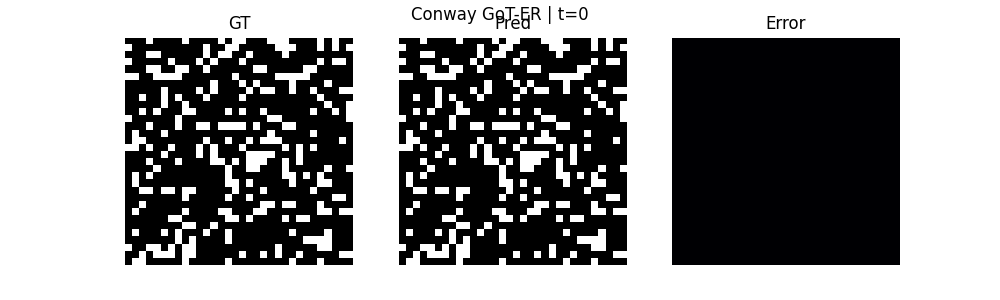

In [ ]:
import base64
from IPython.display import HTML, display

gif_path = make_conway_gif(
    model,
    T=60, H=32, W=32,
    k_support=4,
    n_steps_got=3,   # PAS 50
    fps=8
)



with open(gif_path, "rb") as f:
    data = base64.b64encode(f.read()).decode("utf-8")

display(HTML(f'<img src="data:image/gif;base64,{data}" />'))


# Cellule 2 — GIF Heat (GT vs Pred vs |Error|)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
import torch
import torch.nn.functional as F

def _to_np(x): return x.detach().float().cpu().numpy()

@torch.no_grad()
def make_heat_gif_v2(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                     save_path="/content/heat_goter_v2.gif", fps=8,
                     error_scale="global",   # "global" or "frame"
                     support_independent=True):
    """
    error_scale:
      - "global": vmax fixé au max sur tout le rollout (bon pour voir la dérive)
      - "frame": vmax recalculé à chaque frame (bon pour voir les petites erreurs tôt)
    """
    model.eval()

    # --- Support ---
    if support_independent:
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(1,4), amp=(0.5,1.5), sigma=(1.0,4.0)).to(device)
        seq_s = heat_rollout(u0s, T=max(10, k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)
    else:
        sx = sy = None

    # --- Query ---
    u0q = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)
    true = heat_rollout(u0q, T=T, alpha=alpha)  # len = T+1

    if sx is None:
        seq_s = heat_rollout(u0q, T=max(10, k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)

    # --- Pred rollout (ALIGNÉ) ---
    pred = [u0q]  # MUST start with u0q so pred[t] aligns with true[t]
    u = u0q
    for _ in range(T):
        u_next, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), u, n_steps=n_steps_got)
        pred.append(u_next)
        u = u_next

    assert len(pred) == len(true) == T+1, "Temporal alignment broken"

    true_np = [_to_np(t[0,0]) for t in true]
    pred_np = [_to_np(t[0,0]) for t in pred]
    err_np  = [np.abs(pred_np[t] - true_np[t]) for t in range(T+1)]

    # metrics
    mse_t, mae_t = [], []
    for t in range(1, T+1):
        gt = true[t]
        pr = pred[t]
        mse_t.append(F.mse_loss(pr, gt).item())
        mae_t.append((pr-gt).abs().mean().item())

    # ranges for GT/Pred
    vmin = float(np.min(true_np))
    vmax = float(np.max(true_np))

    # error range
    global_err_max = max(1e-6, float(np.max(err_np)))

    fig, axs = plt.subplots(1,3, figsize=(10,3))
    axs[0].set_title("GT"); axs[1].set_title("Pred"); axs[2].set_title("|Error|")
    for ax in axs: ax.axis("off")

    im0 = axs[0].imshow(true_np[0], cmap="viridis", vmin=vmin, vmax=vmax)
    im1 = axs[1].imshow(pred_np[0], cmap="viridis", vmin=vmin, vmax=vmax)
    im2 = axs[2].imshow(err_np[0], cmap="magma", vmin=0, vmax=global_err_max if error_scale=="global" else max(1e-6, float(np.max(err_np[0]))))
    title = fig.suptitle("t=0")

    def update(t):
        im0.set_data(true_np[t])
        im1.set_data(pred_np[t])
        im2.set_data(err_np[t])

        if error_scale == "frame":
            im2.set_clim(0, max(1e-6, float(np.max(err_np[t]))))

        if t == 0:
            title.set_text("Heat GoT-ER | t=0")
        else:
            title.set_text(f"Heat GoT-ER | t={t} | MSE={mse_t[t-1]:.6f} | MAE={mae_t[t-1]:.6f}")
        return [im0, im1, im2, title]

    ani = animation.FuncAnimation(fig, update, frames=T+1, interval=1000//fps, blit=False)
    ani.save(save_path, writer="pillow", fps=fps)
    plt.close(fig)
    print("Saved:", save_path, "| error_scale:", error_scale)
    return save_path


Saved: /content/heat_global.gif | error_scale: global



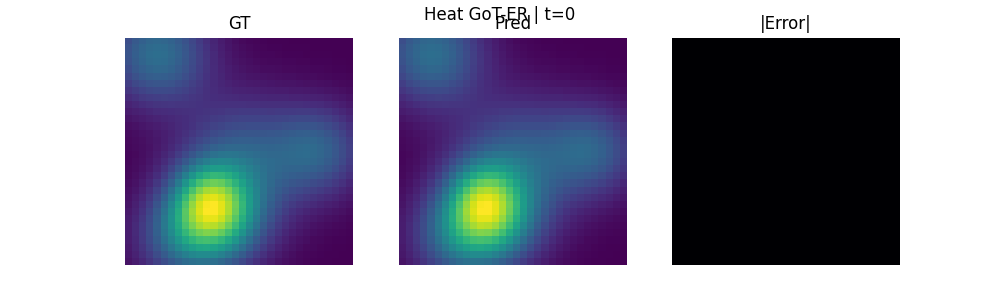

In [ ]:
gif_path = make_heat_gif_v2(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                            error_scale="global", save_path="/content/heat_global.gif")

with open(gif_path, "rb") as f:
    data = base64.b64encode(f.read()).decode("utf-8")

display(HTML(f'<img src="data:image/gif;base64,{data}" />'))


Saved: /content/heat_frame.gif | error_scale: frame



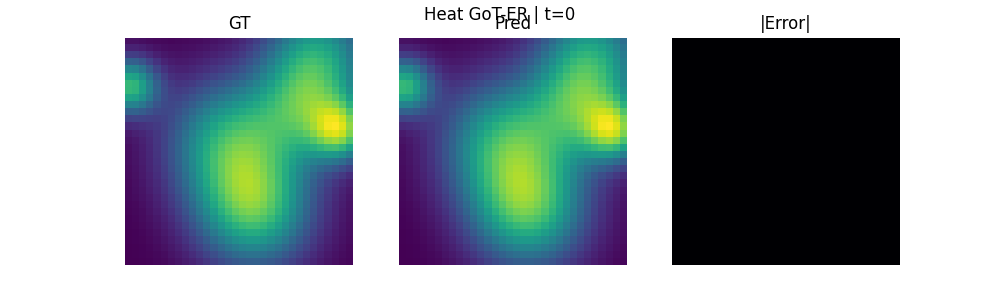

In [ ]:
gif_path = make_heat_gif_v2(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                            error_scale="frame", save_path="/content/heat_frame.gif")

with open(gif_path, "rb") as f:
    data = base64.b64encode(f.read()).decode("utf-8")

display(HTML(f'<img src="data:image/gif;base64,{data}" />'))


In [ ]:
@torch.no_grad()
def make_heat_gif_raw_or_stabilized(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                                    save_path="/content/heat.gif", fps=8,
                                    error_scale="global",
                                    stabilize=False, relax=0.1,
                                    support_independent=True):
    model.eval()

    # --- Support ---
    if support_independent:
        u0s = sample_u0(batch=1, H=H, W=W, n_blobs=(1,4), amp=(0.5,1.5), sigma=(1.0,4.0)).to(device)
        seq_s = heat_rollout(u0s, T=max(10, k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)
    else:
        sx = sy = None

    # --- Query ---
    u0q = sample_u0(batch=1, H=H, W=W, n_blobs=(3,7), amp=(0.8,2.0), sigma=(2.5,7.0)).to(device)
    true = heat_rollout(u0q, T=T, alpha=alpha)

    if sx is None:
        seq_s = heat_rollout(u0q, T=max(10, k_support+1), alpha=alpha)
        sx = torch.cat([seq_s[t] for t in range(k_support)], dim=0)
        sy = torch.cat([seq_s[t+1] for t in range(k_support)], dim=0)

    # --- Pred rollout ---
    pred = [u0q]
    u = u0q
    for _ in range(T):
        u_next, _ = model.rollout(sx.unsqueeze(0), sy.unsqueeze(0), u, n_steps=n_steps_got)
        if stabilize:
            u_next = (1.0 - relax) * u_next + relax * heat_step(u_next, alpha=alpha)
        pred.append(u_next)
        u = u_next

    # --- numpy ---
    true_np = [_to_np(t[0,0]) for t in true]
    pred_np = [_to_np(t[0,0]) for t in pred]
    err_np  = [np.abs(pred_np[t] - true_np[t]) for t in range(T+1)]

    # metrics
    mse_t, mae_t = [], []
    for t in range(1, T+1):
        gt = true[t]
        pr = pred[t]
        mse_t.append(F.mse_loss(pr, gt).item())
        mae_t.append((pr-gt).abs().mean().item())

    vmin = float(np.min(true_np))
    vmax = float(np.max(true_np))
    global_err_max = max(1e-6, float(np.max(err_np)))

    fig, axs = plt.subplots(1,3, figsize=(10,3))
    axs[0].set_title("GT"); axs[1].set_title("Pred"); axs[2].set_title("|Error|")
    for ax in axs: ax.axis("off")

    im0 = axs[0].imshow(true_np[0], cmap="viridis", vmin=vmin, vmax=vmax)
    im1 = axs[1].imshow(pred_np[0], cmap="viridis", vmin=vmin, vmax=vmax)
    im2 = axs[2].imshow(err_np[0], cmap="magma",
                        vmin=0,
                        vmax=global_err_max if error_scale=="global" else max(1e-6, float(np.max(err_np[0]))))

    title = fig.suptitle("t=0")

    def update(t):
        im0.set_data(true_np[t])
        im1.set_data(pred_np[t])
        im2.set_data(err_np[t])
        if error_scale == "frame":
            im2.set_clim(0, max(1e-6, float(np.max(err_np[t]))))

        tag = "STAB" if stabilize else "RAW"
        if t == 0:
            title.set_text(f"Heat GoT-ER ({tag}) | t=0")
        else:
            title.set_text(f"Heat GoT-ER ({tag}) | t={t} | MSE={mse_t[t-1]:.6f} | MAE={mae_t[t-1]:.6f}")
        return [im0, im1, im2, title]

    ani = animation.FuncAnimation(fig, update, frames=T+1, interval=1000//fps, blit=False)
    ani.save(save_path, writer="pillow", fps=fps)
    plt.close(fig)
    print("Saved:", save_path, "| stabilize:", stabilize, "| error_scale:", error_scale)
    return save_path

# Génère les 2 GIFs :
raw_path = make_heat_gif_raw_or_stabilized(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                                          save_path="/content/heat_raw_global.gif", error_scale="global",
                                          stabilize=False)

stab_path = make_heat_gif_raw_or_stabilized(model, T=60, H=32, W=32, k_support=4, n_steps_got=3, alpha=0.15,
                                           save_path="/content/heat_stab_global.gif", error_scale="global",
                                           stabilize=True, relax=0.1)


Saved: /content/heat_raw_global.gif | stabilize: False | error_scale: global
Saved: /content/heat_stab_global.gif | stabilize: True | error_scale: global


RAW (sans stabilisation)



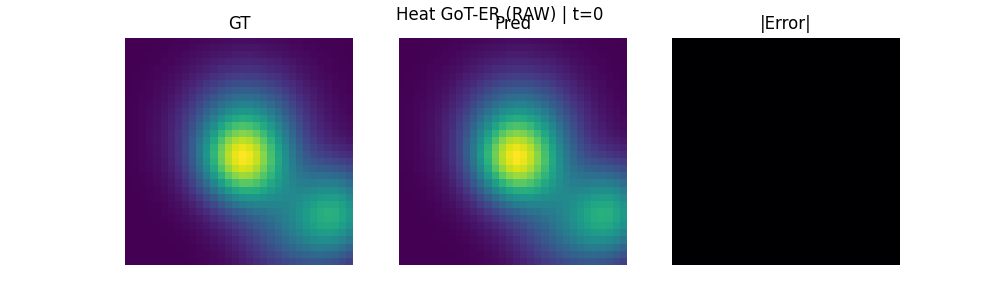

STABILIZED (avec relax)



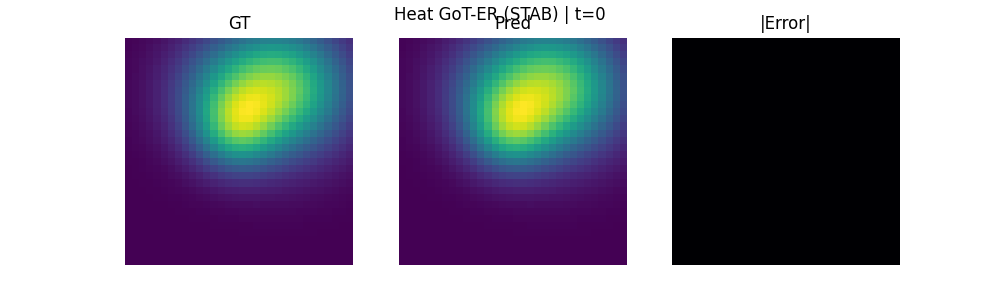

In [ ]:
from IPython.display import Image, display
import base64
from IPython.display import HTML

def display_gif(path, width=600):
    with open(path, "rb") as f:
        data = base64.b64encode(f.read()).decode("utf-8")
    display(HTML(f'<img src="data:image/gif;base64,{data}" width="{width}"/>'))

print("RAW (sans stabilisation)")
display_gif("/content/heat_raw_global.gif", width=700)

print("STABILIZED (avec relax)")
display_gif("/content/heat_stab_global.gif", width=700)


Heat :

n_steps_got = 3

alpha = 0.15

RAW : dérive tardive + checkerboard (mode pair/impair)

STAB : relaxation physique → stabilité long horizon

Méthodologie validée :

support indépendant

rollout long

GT simulé exact

visualisation qualitative + métriques

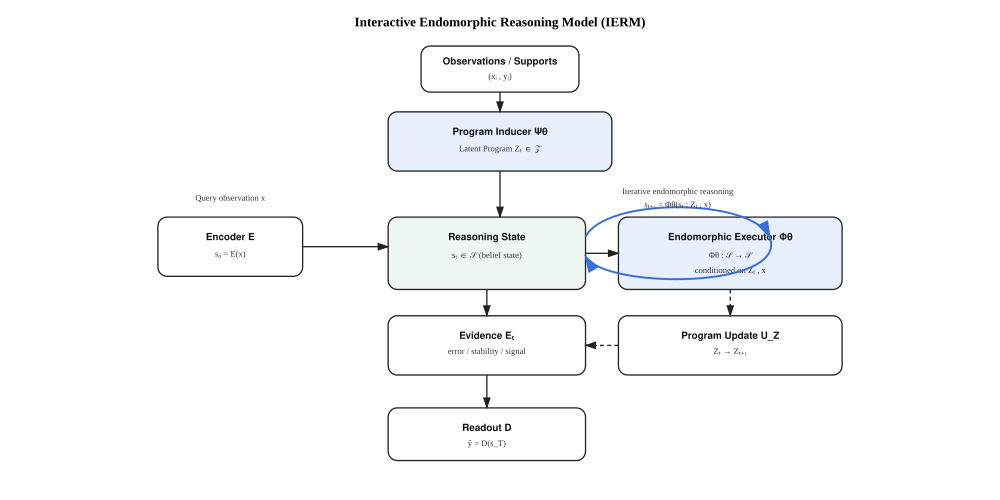

In [ ]:
from IPython.display import SVG, display

svg = r"""
<svg xmlns="http://www.w3.org/2000/svg" width="1000" height="500" viewBox="0 0 1200 760">
  <style>
    .box {
      fill: #ffffff;
      stroke: #222;
      stroke-width: 2;
      rx: 14;
      ry: 14;
    }
    .soft {
      fill: #f3f6fb;
    }
    .accent {
      fill: #e8efff;
    }
    .state {
      fill: #eef7f1;
    }
    .text {
      font-family: Helvetica, Arial, sans-serif;
      fill: #111;
      font-size: 15px;
    }
    .title {
      font-size: 20px;
      font-weight: bold;
    }
    .small {
      font-size: 13px;
      fill: #333;
    }
    .arrow {
      stroke: #222;
      stroke-width: 2;
      fill: none;
      marker-end: url(#arrow);
    }
    .loop {
      stroke: #3b6fd8;
      stroke-width: 3;
      fill: none;
      marker-end: url(#arrowBlue);
    }
    .dashed {
      stroke-dasharray: 6 5;
    }
  </style>

  <defs>
    <marker id="arrow" markerWidth="10" markerHeight="10" refX="8" refY="3" orient="auto">
      <path d="M0,0 L0,6 L9,3 z" fill="#222"/>
    </marker>
    <marker id="arrowBlue" markerWidth="10" markerHeight="10" refX="8" refY="3" orient="auto">
      <path d="M0,0 L0,6 L9,3 z" fill="#3b6fd8"/>
    </marker>
  </defs>

  <!-- Title -->
  <text x="600" y="40" text-anchor="middle" class="title">
    Interactive Endomorphic Reasoning Model (IERM)
  </text>

  <!-- Observations -->
  <rect x="480" y="70" width="240" height="70" class="box"/>
  <text x="600" y="98" text-anchor="middle" class="text"><tspan font-weight="bold">Observations / Supports</tspan></text>
  <text x="600" y="120" text-anchor="middle" class="small">(xᵢ , yᵢ)</text>

  <!-- Program Inducer -->
  <rect x="430" y="170" width="340" height="90" class="box accent"/>
  <text x="600" y="205" text-anchor="middle" class="text"><tspan font-weight="bold">Program Inducer Ψθ</tspan></text>
  <text x="600" y="230" text-anchor="middle" class="small">Latent Program Zₜ ∈ 𝒵</text>

  <!-- Encoder -->
  <rect x="80" y="330" width="220" height="90" class="box"/>
  <text x="190" y="365" text-anchor="middle" class="text"><tspan font-weight="bold">Encoder E</tspan></text>
  <text x="190" y="390" text-anchor="middle" class="small">s₀ = E(x)</text>
  <text x="190" y="305" text-anchor="middle" class="small">Query observation x</text>

  <!-- Reasoning State -->
  <rect x="430" y="330" width="300" height="110" class="box state"/>
  <text x="580" y="365" text-anchor="middle" class="text"><tspan font-weight="bold">Reasoning State</tspan></text>
  <text x="580" y="392" text-anchor="middle" class="small">sₜ ∈ 𝒮 (belief state)</text>

  <!-- Executor -->
  <rect x="780" y="330" width="340" height="110" class="box accent"/>
  <text x="950" y="365" text-anchor="middle" class="text"><tspan font-weight="bold">Endomorphic Executor Φθ</tspan></text>
  <text x="950" y="392" text-anchor="middle" class="small">Φθ : 𝒮 → 𝒮</text>
  <text x="950" y="415" text-anchor="middle" class="small">conditioned on Zₜ , x</text>

  <!-- Evidence -->
  <rect x="430" y="480" width="300" height="90" class="box"/>
  <text x="580" y="515" text-anchor="middle" class="text"><tspan font-weight="bold">Evidence Eₜ</tspan></text>
  <text x="580" y="538" text-anchor="middle" class="small">error / stability / signal</text>

  <!-- Program Update -->
  <rect x="780" y="480" width="340" height="90" class="box"/>
  <text x="950" y="515" text-anchor="middle" class="text"><tspan font-weight="bold">Program Update U_Z</tspan></text>
  <text x="950" y="538" text-anchor="middle" class="small">Zₜ → Zₜ₊₁</text>

  <!-- Decoder -->
  <rect x="430" y="620" width="300" height="80" class="box"/>
  <text x="580" y="655" text-anchor="middle" class="text"><tspan font-weight="bold">Readout D</tspan></text>
  <text x="580" y="678" text-anchor="middle" class="small">ŷ = D(s_T)</text>

  <!-- Arrows -->
  <line x1="600" y1="140" x2="600" y2="170" class="arrow"/>
  <line x1="600" y1="260" x2="600" y2="330" class="arrow"/>
  <line x1="300" y1="375" x2="430" y2="375" class="arrow"/>
  <line x1="730" y1="385" x2="780" y2="385" class="arrow"/>
  <line x1="580" y1="440" x2="580" y2="480" class="arrow"/>
  <line x1="580" y1="570" x2="580" y2="620" class="arrow"/>
  <line x1="950" y1="440" x2="950" y2="480" class="arrow dashed"/>
  <line x1="780" y1="525" x2="730" y2="525" class="arrow dashed"/>

  <!-- Iterative reasoning loop -->
  <path d="M 730 360 C 760 300, 980 300, 1010 360" class="loop"/>
  <path d="M 1010 360 C 1040 440, 760 440, 730 390" class="loop"/>

  <!-- Loop label -->
  <text x="870" y="295" text-anchor="middle" class="small" fill="#3b6fd8">
    Iterative endomorphic reasoning
  </text>
  <text x="870" y="315" text-anchor="middle" class="small" fill="#3b6fd8">
    sₜ₊₁ = Φθ(sₜ ; Zₜ , x)
  </text>

</svg>

"""
display(SVG(data=svg))